# Import

In [1]:
import os
import cv2
import csv
import math
import time
import numpy as np
import pandas as pd
import random
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.collections import LineCollection
from sklearn.preprocessing import MinMaxScaler

from tqdm import tqdm

# GPU Setting

In [2]:
import tensorflow as tf

print(tf.__version__)
print(tf.config.list_physical_devices())

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
    # Currently, memory growth needs to be the same across GPUs
        tf.config.experimental.set_visible_devices(gpus[0], 'GPU')
      #  for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
        print(e)

2.6.0
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
1 Physical GPUs, 1 Logical GPUs


# Global Variables

In [3]:
LABEL_FILE = "../Label_Data_Info.xlsx"
VIDEO_PATH = "../../2_EyeTrackingAnalysis/data/"
COORDINATE_PATH = "../../2_EyeTrackingAnalysis/data/"

FS_GRADCAM_PATH = "LOG_Zaxis_FS/GradCAM_heatmap/"
FS_SEG_PROB_FILE = "LOG_Zaxis_FS/Segment_Probability/seg_probability.csv"

FOLDIDX_FILE = "../../5_Gait_and_Eye/Training_Fix_5Fold/eyes_test_5fold.csv"
VIDEOTYPE_FILE = "_videoType.csv"

PREDICTION_LABEL_FILE = "LOG_Zaxis_FS/Facial_RandomSeed/Results/10_FS_weighted.csv"

FS_threshold_facial_5f = [0.4, 0.45, 0.42, 0.41, 0.42]    ### LOG_FS/Facial_RandomSeed/10/Parameters/threshold_5f.csv

n_GAP = 150
n_PERIOD = 300

IMG_HEIGHT = 0
IMG_WIDTH = 0

# heatmap_feature_name = ['lEye_pt1_x', 'lEye_pt1_y', 'lEye_pt2_x', 'lEye_pt2_y', 'lEye_pt3_x', 'lEye_pt3_y', 
#                         'rEye_pt1_x', 'rEye_pt1_y', 'rEye_pt2_x', 'rEye_pt2_y', 'rEye_pt3_x', 'rEye_pt3_y']
heatmap_feature_name = ['lEye_pt1_x', 'lEye_pt1_y', 'lEye_pt1_z',
                        'lEye_pt2_x', 'lEye_pt2_y', 'lEye_pt2_z', 
                        'lEye_pt3_x', 'lEye_pt3_y', 'lEye_pt3_z', 
                        'rEye_pt1_x', 'rEye_pt1_y', 'rEye_pt1_z', 
                        'rEye_pt2_x', 'rEye_pt2_y', 'rEye_pt2_z', 
                        'rEye_pt3_x', 'rEye_pt3_y', 'rEye_pt3_z']


# FS_feature_name = ['lEye_pt2_x', 'lEye_pt2_y', 'lEye_pt3_x', 'lEye_pt3_y', 'rEye_pt1_x', 'rEye_pt1_y', 'rEye_pt2_x', 'rEye_pt2_y', 'rEye_pt3_x', 'rEye_pt3_y']
FS_feature_name = ['lEye_pt2_z', 'lEye_pt3_x', 'lEye_pt3_y', 'lEye_pt3_z', 'rEye_pt1_x', 'rEye_pt1_y', 'rEye_pt1_z', 'rEye_pt2_x', 'rEye_pt2_y', 'rEye_pt2_z', 'rEye_pt3_x', 'rEye_pt3_y', 'rEye_pt3_z']



remove_dementia_pid_list = [22, 33, 57, 58, 64, 66, 67]
remove_dementia_pid_list_str = ['22', '33', '57', '58', '64', '66', '67']

In [4]:
### blur, green, red
# https://matplotlib.org/stable/users/explain/colors/colorbar_only.html
# https://www.tutorialspoint.com/map-values-to-colors-in-matplotlib
# https://matplotlib.org/stable/users/explain/colors/colormaps.html
# https://www.rapidtables.com/web/color/RGB_Color.html
COLOR_White = (255, 255, 255)      # (0)
COLOR_DarkBlue = (140, 0, 0)       # (1~24)
COLOR_Blue = (210, 0, 0)           # (25~49)
COLOR_LightBlue = (250, 206, 135)  # (50~74)
COLOR_AquaMarine = (212, 255, 127) # (75~99)
COLOR_Green = (144, 238, 144)      # (100~124)
COLOR_Yellow = (0, 255, 255)       # (125~149)
COLOR_Gold = (0, 215, 255)         # (150~169)
COLOR_Orange = (0, 165, 255)       # (170~189)
COLOR_OrangeRed = (0, 69, 255)     # (190~209)
COLOR_Red = (0, 0, 250)            # (210~229)
COLOR_DarkRed = (0, 0, 139)        # (230~255)

# Global Data

In [5]:
def load_all_subject_id(dir_path):
    tmp_list = []
    for fname in list(os.listdir(dir_path)): ### ex. "37_cut1_Segment1.csv"
        pid = int(fname.split("_")[0])    ### ex. 37
        # if pid not in remove_dementia_pid_list:
        if pid not in tmp_list:
            tmp_list.append(pid)
    tmp_list.sort()
    return tmp_list


def load_segment_probability(filename):
    tmp_dict = {}
    
    df = pd.read_csv(filename, header=None)
    
    for idx in df.index:
        segName = df.iloc[idx][0]
        prob = df.iloc[idx][1]
        pid = int(segName.split('_')[0])
        segId = segName.split('_')[2]
        if pid not in tmp_dict: 
            tmp_dict[pid] = {}
        tmp_dict[pid]['segment_'+segId] = prob
    return tmp_dict


def load_all_subject_label(filename):
    df_label = pd.read_excel(filename, usecols=['編號', 'Age', 'Gender', '_Label'])
    df_label = df_label.fillna(0)
    df_label = df_label.astype({"_Label": int})
    
    Label_df = df_label['_Label']
    Label_arr = np.array(Label_df)
    Label_dict = dict(zip(df_label.編號, df_label._Label))
    return Label_dict


def load_all_subject_foldIdx(filename):
    tmp_walk_testID_5f = []
    
    walk_file = open(filename, "r")
    tmp_walk_testID_5f = list(csv.reader(walk_file, delimiter=","))
    walk_file.close()

    tmp_dict = {}
    for foldIdx, fold in enumerate(tmp_walk_testID_5f):
        for pid in fold:
            tmp_dict[int(pid)] = foldIdx
    return tmp_dict


def load_all_subject_videoType(filename):
    tmp_dict = {}
    if not os.path.exists(filename):
        print(f'[VideoType] CSV does not exit.')
    else:
        df = pd.read_csv(filename)
        n_row, n_col = df.shape[0], df.shape[1]
        for idx in range(n_row):
            pid = int(df.iloc[idx, 0])
            videotype = int(df.iloc[idx, 1])
            tmp_dict[pid] = videotype
    return tmp_dict


def load_all_subject_pred_label(filename):
    tmp_dict = {}
    if not os.path.exists(filename):
        print(f'[Prediction Result] CSV does not exit.')
    else:
        df = pd.read_csv(filename)
        n_row, n_col = df.shape[0], df.shape[1]
        for idx in range(n_row):
            pid = int(df.iloc[idx]['pid'])
            pred_label = int(df.iloc[idx]['prediction'])
            tmp_dict[pid] = pred_label
    return tmp_dict

In [6]:
all_pid_list = []
all_pid_list = load_all_subject_id(FS_GRADCAM_PATH)
print(f'Number of Subjects: {len(all_pid_list)}')
print(all_pid_list)

Number of Subjects: 96
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]


In [7]:
label_dict = {}

label_dict = load_all_subject_label(LABEL_FILE)
print(f'Total Number of Subjects: {len(label_dict)}')
print(label_dict)

Total Number of Subjects: 100
{1: 0, 2: 0, 3: 0, 4: 1, 5: 0, 6: 0, 7: 0, 8: 0, 9: 1, 10: 1, 11: 1, 12: 1, 13: 0, 14: 0, 15: 0, 16: 1, 17: 1, 18: 1, 19: 0, 20: 1, 21: 0, 22: 0, 23: 1, 24: 1, 25: 1, 26: 1, 27: 1, 28: 1, 29: 0, 30: 0, 31: 1, 32: 1, 33: 0, 34: 0, 35: 1, 36: 1, 37: 1, 38: 1, 39: 1, 40: 1, 41: 0, 42: 0, 43: 0, 44: 0, 45: 1, 46: 1, 47: 0, 48: 1, 49: 0, 50: 0, 51: 0, 52: 0, 53: 0, 54: 0, 55: 0, 56: 0, 57: 0, 58: 0, 59: 1, 60: 1, 61: 1, 62: 1, 63: 0, 64: 0, 65: 1, 66: 0, 67: 0, 68: 0, 69: 0, 70: 0, 71: 0, 72: 0, 73: 0, 74: 0, 75: 0, 76: 0, 77: 0, 78: 0, 79: 0, 80: 0, 81: 0, 82: 0, 83: 0, 84: 0, 85: 0, 86: 0, 87: 0, 88: 0, 89: 0, 90: 0, 91: 0, 92: 0, 93: 0, 94: 0, 95: 0, 96: 0, 97: 0, 98: 0, 99: 0, 100: 0}


In [8]:
foldIdx_dict = {}

foldIdx_dict = load_all_subject_foldIdx(FOLDIDX_FILE)
print(f'Number of Subjects: {len(foldIdx_dict)}')
print(foldIdx_dict)

Number of Subjects: 96
{1: 0, 2: 0, 4: 0, 8: 0, 11: 0, 14: 0, 29: 0, 34: 0, 36: 0, 37: 0, 44: 0, 45: 0, 49: 0, 59: 0, 67: 0, 75: 0, 81: 0, 83: 0, 89: 0, 94: 0, 5: 1, 10: 1, 12: 1, 15: 1, 21: 1, 23: 1, 35: 1, 43: 1, 52: 1, 62: 1, 65: 1, 66: 1, 70: 1, 82: 1, 87: 1, 90: 1, 91: 1, 93: 1, 96: 1, 3: 2, 13: 2, 20: 2, 28: 2, 33: 2, 40: 2, 42: 2, 46: 2, 47: 2, 48: 2, 57: 2, 68: 2, 69: 2, 71: 2, 72: 2, 76: 2, 79: 2, 86: 2, 97: 2, 6: 3, 100: 3, 16: 3, 19: 3, 26: 3, 27: 3, 30: 3, 31: 3, 32: 3, 38: 3, 50: 3, 51: 3, 53: 3, 74: 3, 78: 3, 84: 3, 95: 3, 99: 3, 7: 4, 9: 4, 17: 4, 18: 4, 22: 4, 24: 4, 25: 4, 39: 4, 54: 4, 55: 4, 56: 4, 58: 4, 63: 4, 64: 4, 73: 4, 77: 4, 80: 4, 88: 4, 92: 4, 98: 4}


In [9]:
videoType_dict = {}

videoType_dict = load_all_subject_videoType(VIDEOTYPE_FILE)
print(f'Number of Subjects: {len(videoType_dict)}')
print(videoType_dict)

Number of Subjects: 99
{1: 1, 2: 1, 3: 1, 4: 1, 5: 1, 6: 1, 7: 1, 8: 1, 9: 1, 10: 1, 100: 2, 11: 1, 12: 1, 13: 1, 14: 1, 15: 1, 16: 1, 17: 1, 18: 1, 19: 1, 20: 1, 21: 1, 22: 1, 23: 1, 24: 1, 25: 1, 26: 1, 27: 1, 28: 1, 29: 1, 30: 1, 31: 1, 32: 1, 33: 1, 34: 1, 35: 1, 36: 1, 37: 1, 38: 1, 39: 1, 40: 1, 42: 1, 43: 1, 44: 1, 45: 1, 46: 1, 47: 1, 48: 1, 49: 1, 50: 1, 51: 1, 52: 1, 53: 2, 54: 2, 55: 2, 56: 2, 57: 2, 58: 2, 59: 2, 60: 2, 61: 2, 62: 2, 63: 2, 64: 2, 65: 2, 66: 2, 67: 2, 68: 2, 69: 2, 70: 2, 71: 2, 72: 2, 73: 2, 74: 2, 75: 2, 76: 2, 77: 2, 78: 2, 79: 2, 80: 2, 81: 2, 82: 2, 83: 2, 84: 2, 85: 2, 86: 2, 87: 2, 88: 2, 89: 2, 90: 2, 91: 2, 92: 2, 93: 2, 94: 2, 95: 2, 96: 2, 97: 2, 98: 2, 99: 2}


In [10]:
segProb_dict = {}
FS_segProb_dict = {}

# segProb_dict = load_segment_probability(SEG_PROB_FILE)
FS_segProb_dict = load_segment_probability(FS_SEG_PROB_FILE)

# print(f'Probability Result in Original:\n{segProb_dict[60]}\n')
print(f'Probability Result in Feature Selection:\n{FS_segProb_dict[1]}')

Probability Result in Feature Selection:
{'segment_4': 0.2225, 'segment_8': 0.6253, 'segment_7': 0.8691, 'segment_1': 0.0679, 'segment_2': 0.3651, 'segment_0': 0.2396, 'segment_6': 0.2181, 'segment_5': 0.6275, 'segment_3': 0.4442}


In [11]:
# print(segProb_dict[1])
print(FS_segProb_dict[1])

{'segment_4': 0.2225, 'segment_8': 0.6253, 'segment_7': 0.8691, 'segment_1': 0.0679, 'segment_2': 0.3651, 'segment_0': 0.2396, 'segment_6': 0.2181, 'segment_5': 0.6275, 'segment_3': 0.4442}


In [12]:
pred_label_dict = {}

pred_label_dict = load_all_subject_pred_label(PREDICTION_LABEL_FILE)
print(f'Number of Subjects: {len(pred_label_dict)}')
print(pred_label_dict)

Number of Subjects: 96
{1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 1, 7: 0, 8: 1, 9: 0, 10: 0, 11: 0, 12: 0, 13: 0, 14: 0, 15: 0, 16: 1, 17: 1, 18: 0, 19: 0, 20: 1, 21: 0, 22: 0, 23: 1, 24: 1, 25: 0, 26: 1, 27: 1, 28: 1, 29: 0, 30: 0, 31: 1, 32: 1, 33: 0, 34: 0, 35: 0, 36: 1, 37: 0, 38: 1, 39: 0, 40: 0, 42: 0, 43: 0, 44: 0, 45: 1, 46: 0, 47: 0, 48: 0, 49: 0, 50: 1, 51: 0, 52: 0, 53: 0, 54: 0, 55: 0, 56: 0, 57: 0, 58: 0, 59: 1, 62: 0, 63: 0, 64: 0, 65: 0, 66: 0, 67: 0, 68: 1, 69: 1, 70: 0, 71: 1, 72: 0, 73: 0, 74: 0, 75: 0, 76: 0, 77: 0, 78: 0, 79: 0, 80: 0, 81: 0, 82: 0, 83: 0, 84: 0, 86: 0, 87: 0, 88: 0, 89: 0, 90: 0, 91: 0, 92: 0, 93: 0, 94: 0, 95: 0, 96: 0, 97: 0, 98: 0, 99: 0, 100: 0}


# Show on Video

In [13]:
# FS_feature_name = ['lEye_pt2_x', 'lEye_pt2_y', 'lEye_pt3_x', 'lEye_pt3_y', 'rEye_pt1_x', 'rEye_pt1_y', 'rEye_pt2_x', 'rEye_pt2_y', 'rEye_pt3_x', 'rEye_pt3_y']
FS_feature_name = ['lEye_pt2_z', 'lEye_pt3_x', 'lEye_pt3_y', 'lEye_pt3_z', 'rEye_pt1_x', 'rEye_pt1_y', 'rEye_pt1_z', 'rEye_pt2_x', 'rEye_pt2_y', 'rEye_pt2_z', 'rEye_pt3_x', 'rEye_pt3_y', 'rEye_pt3_z']


def FS_read_explanation_from_csv_file(target_pid, dir_path):
    heatmap_dict = {}
    for fname in list(os.listdir(dir_path)): ### ex. "37_Segment1.csv"
        pid = int(fname.split("_")[0])       ### ex. 37
        segmentName = fname.split(".")[0].split("_")[1]    ### ex. Segment1

        if pid==target_pid:
            filepath = dir_path + fname      ### ex. "Facial_Model3_0509/FS_Dynamic/GradCAM_heatmap/37_Segment1.csv"
            df = pd.read_csv(filepath, index_col=0, header=None) ### Set first column as index

            heatmap_dict[segmentName] = df
    return heatmap_dict

## Points
* Feature Selection (Dynamic): 10 features

In [60]:
def FS_show_GradCAM_on_video(pid, video_dir, coord_dir, heatmap_dict, videoType):
    ### ================================================================ Get heatmap value of Eyes ================================================================
    segmentNames = list(heatmap_dict.keys())
    segmentNames.sort()
    sorted_dict = {segName: heatmap_dict[segName] for segName in segmentNames}
    heatmap_dict = sorted_dict
    ### ---------------------- Get some info [start] --------------------
    label = label_dict[pid]
    foldIdx = foldIdx_dict[pid]
    threshold = FS_threshold_facial_5f[foldIdx]
    prob_dict = FS_segProb_dict[pid]   ### ex. prob_dict = {'segment_0': 0.876, 'segment_1': 0.9994}
    prob_dict_rename = {}              ### ex. prob_dict_rename = {'Segment0': 0.876, 'Segment1': 0.9994}
    for key in prob_dict:
        prob = prob_dict[key]
        segName = 'Segment' + str(key.split('_')[1])
        prob_dict_rename[segName] = prob
    ### ---------------------- Get some info [end] -----------------------

    n_segment = len(heatmap_dict)
    n_frame = (n_segment-1)*n_GAP + n_PERIOD
    LeftEye = [0] * n_frame
    RightEye = [0] * n_frame
    Times = [0] * n_frame

    start = 0
    end = n_PERIOD
    # ## --------------------------- check whether draw or not with threshold ---------------------------
    # for key in heatmap_dict:
    #     prob = prob_dict_rename[key]
    #     flag_draw_heatmap = False

    #     if label==0:
    #         if prob < threshold: flag_draw_heatmap = True
    #     elif label==1:
    #         if prob > threshold: flag_draw_heatmap = True

    #     if flag_draw_heatmap==True:
    #         heatmap = heatmap_dict[key] ### heatmap for one segment
    
    #         n_feature, n_timestamp = heatmap.shape[0], heatmap.shape[1] ### 10 features with 300 timestamp
    #         heatmap = heatmap.iloc[:, :].values
    
    #         for i in range(n_timestamp):
    #             cur_frame = start + i

    #             ['lEye_pt2_x', 'lEye_pt2_y', 'lEye_pt3_x', 'lEye_pt3_y', 'rEye_pt1_x', 'rEye_pt1_y', 'rEye_pt2_x', 'rEye_pt2_y', 'rEye_pt3_x', 'rEye_pt3_y']
    #             left2x, left2y, left3x, left3y = heatmap[0][i], heatmap[1][i], heatmap[2][i], heatmap[3][i]
    #             right1x, right1y, right2x, right2y, right3x, right3y = heatmap[4][i], heatmap[5][i], heatmap[6][i], heatmap[7][i], heatmap[8][i], heatmap[9][i]

    #             left = max(left2x, left2y, left3x, left3y)
    #             right = max(right1x, right1y, right2x, right2y, right3x, right3y)
    
    #             LeftEye[cur_frame] += left
    #             RightEye[cur_frame] += right
    #             Times[cur_frame] += 1
                
    #     start += n_GAP
    #     end = start + n_PERIOD

    # ## --------------------------- draw every segment directly ---------------------------
    for key in heatmap_dict:
        prob = prob_dict_rename[key]
        heatmap = heatmap_dict[key] ### heatmap for one segment

        n_feature, n_timestamp = heatmap.shape[0], heatmap.shape[1] ### 10 features with 300 timestamp
        heatmap = heatmap.iloc[:, :].values

        for i in range(n_timestamp):
            cur_frame = start + i

            ['lEye_pt2_x', 'lEye_pt2_y', 'lEye_pt3_x', 'lEye_pt3_y', 'rEye_pt1_x', 'rEye_pt1_y', 'rEye_pt2_x', 'rEye_pt2_y', 'rEye_pt3_x', 'rEye_pt3_y']
            left2x, left2y, left3x, left3y = heatmap[0][i], heatmap[1][i], heatmap[2][i], heatmap[3][i]
            right1x, right1y, right2x, right2y, right3x, right3y = heatmap[4][i], heatmap[5][i], heatmap[6][i], heatmap[7][i], heatmap[8][i], heatmap[9][i]

            left = max(left2x, left2y, left3x, left3y)
            right = max(right1x, right1y, right2x, right2y, right3x, right3y)

            LeftEye[cur_frame] += left
            RightEye[cur_frame] += right
            Times[cur_frame] += 1
                
        start += n_GAP
        end = start + n_PERIOD
        

    for i in range(n_frame):
        if Times[i]!=0:
            LeftEye[i] = int(LeftEye[i]/Times[i])
            RightEye[i] = int(RightEye[i]/Times[i])
            
    # ## ---------------- Get Color Mapping [start] ----------------
    max_LeftEye = max(LeftEye)
    max_RightEye = max(RightEye)
    color_map = mpl.colormaps.get_cmap('jet') # 'cool', viridis'
    norm_LeftEye = mpl.colors.Normalize(vmin=min(LeftEye), vmax=max(LeftEye))
    norm_RightEye = mpl.colors.Normalize(vmin=min(RightEye), vmax=max(RightEye))
    color_mapper_LeftEye = mpl.cm.ScalarMappable(norm=norm_LeftEye, cmap=color_map)
    color_mapper_RightEye = mpl.cm.ScalarMappable(norm=norm_RightEye, cmap=color_map)
    # fig, ax = plt.subplots(figsize=(6, 1), layout='constrained')
    # fig.colorbar(color_mapper_LeftEye, cax=ax, orientation='horizontal', label='Some Units')
    # ## ---------------- Get Color Mapping [end] ------------------
    ### ===========================================================================================================================================================
        
    ### ========================================================== Get Coordinate of Left/Right Eyes ==============================================================
    ### ex. 2_EyeTrackingAnalysis/data/01/Description1_20240314/1_raw_coordinate_data.csv

    coord_csv_file = coord_dir + str(pid) + '/Description1_20240314/1_raw_coordinate_data.csv'
    if pid>=1 and pid<=9:
        coord_csv_file = coord_dir + ("%02d" % pid) + '/Description1_20240314/1_raw_coordinate_data.csv'
    print(coord_csv_file)

    if os.path.exists(coord_csv_file)==False:
        print(f'[pid {pid}] CSV file does NOT exist.')
    else:
        coord_df = pd.read_csv(coord_csv_file, header=None)
        coord_arr = coord_df.iloc[:, :].values ### (xxx, 32) = xxx rows & 32 cols

    pt1, pt2, pt3, pt4, pt5, pt6, pt7, pt8 = [], [], [], [], [], [], [], []         # 8 points of left eyes
    pt9, pt10, pt11, pt12, pt13, pt14, pt15, pt16 = [], [], [], [], [], [], [], []  # 8 points of right eyes
    for i in range(n_frame):
        pt1.append([int(coord_arr[i][0]), int(coord_arr[i][1])])
        pt2.append([int(coord_arr[i][2]), int(coord_arr[i][3])])
        pt3.append([int(coord_arr[i][4]), int(coord_arr[i][5])])
        pt4.append([int(coord_arr[i][6]), int(coord_arr[i][7])])
        pt5.append([int(coord_arr[i][8]), int(coord_arr[i][9])])
        pt6.append([int(coord_arr[i][10]), int(coord_arr[i][11])])
        pt7.append([int(coord_arr[i][12]), int(coord_arr[i][13])])
        pt8.append([int(coord_arr[i][14]), int(coord_arr[i][15])])
        pt9.append([int(coord_arr[i][16]), int(coord_arr[i][17])])
        pt10.append([int(coord_arr[i][18]), int(coord_arr[i][19])])
        pt11.append([int(coord_arr[i][20]), int(coord_arr[i][21])])
        pt12.append([int(coord_arr[i][22]), int(coord_arr[i][23])])
        pt13.append([int(coord_arr[i][24]), int(coord_arr[i][25])])
        pt14.append([int(coord_arr[i][26]), int(coord_arr[i][27])])
        pt15.append([int(coord_arr[i][28]), int(coord_arr[i][29])])
        pt16.append([int(coord_arr[i][30]), int(coord_arr[i][31])])
    ### ===========================================================================================================================================================

    # ### ====================================================================== Show on Video ======================================================================
    # FPS = 10
    FPS = 30

    ### -------------- Seting Image Width and Height [start] -------------
    if videoType==1:
        IMG_HEIGHT = 480
        IMG_WIDTH = 640
    elif videoType==2:
        IMG_HEIGHT = 720
        IMG_WIDTH = 1280
    ### -------------- Seting Image Width and Height [end] ---------------

    video_fname_folder = VIDEO_PATH + str(pid) + '/Description1_GradCAM/'
    if pid>=1 and pid<=9:
        video_fname_folder = VIDEO_PATH + ("%02d" % pid) + '/Description1_GradCAM/'
    if not os.path.exists(video_fname_folder):
        os.makedirs(video_fname_folder)
    
    video_fname_src = VIDEO_PATH + str(pid) + '/Description1/clip1.mp4'
    video_fname_dst = VIDEO_PATH + str(pid) + '/Description1_GradCAM/' + '20240509_FPS' + str(FPS) + '.mp4'  
    if pid>=1 and pid<=9:
        video_fname_src = VIDEO_PATH + ("%02d" % pid) + '/Description1/clip1.mp4'
        video_fname_dst = VIDEO_PATH + ("%02d" % pid) + '/Description1_GradCAM/' + '20240509_FPS' + str(FPS) + '.mp4'  

    ### Get video info
    cap = cv2.VideoCapture(video_fname_src)
    FPS = cap.get(cv2.CAP_PROP_FPS)
    
    ### Define video writer
    VIDEO_CODEC = "mp4v"
    OUT_WIDTH, OUT_HEIGHT = IMG_WIDTH, IMG_HEIGHT
    video_writer = cv2.VideoWriter(video_fname_dst, cv2.VideoWriter_fourcc(*VIDEO_CODEC), FPS, (IMG_WIDTH, IMG_HEIGHT))

    n_video_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    for frameIdx, frame in enumerate(tqdm(range(n_video_frames), total=n_video_frames)):
        ret, img = cap.read()
        if ret==False: break

        # ## ------------------ Drawing Method 2 [start] ------------------
        img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT), interpolation=cv2.INTER_NEAREST)
        if frameIdx<n_frame:
            # ## Left Eyes
            cValue = LeftEye[frameIdx]
            cRed = int(color_mapper_LeftEye.to_rgba(cValue)[0]*255)
            cGreen = int(color_mapper_LeftEye.to_rgba(cValue)[1]*255)
            cBlue = int(color_mapper_LeftEye.to_rgba(cValue)[2]*255)
            target_color = (cBlue, cGreen, cRed)
            if cValue==0: target_color=COLOR_White
            img = cv2.circle(img, center=(pt1[frameIdx][0], pt1[frameIdx][1]), radius=2, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(pt2[frameIdx][0], pt2[frameIdx][1]), radius=2, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(pt3[frameIdx][0], pt3[frameIdx][1]), radius=2, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(pt4[frameIdx][0], pt4[frameIdx][1]), radius=2, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(pt5[frameIdx][0], pt5[frameIdx][1]), radius=2, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(pt6[frameIdx][0], pt6[frameIdx][1]), radius=2, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(pt7[frameIdx][0], pt7[frameIdx][1]), radius=2, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(pt8[frameIdx][0], pt8[frameIdx][1]), radius=2, color=target_color, thickness=-1)
            
            # ## Right Eyes
            cValue = RightEye[frameIdx]
            cRed = int(color_mapper_RightEye.to_rgba(cValue)[0]*255)
            cGreen = int(color_mapper_RightEye.to_rgba(cValue)[1]*255)
            cBlue = int(color_mapper_RightEye.to_rgba(cValue)[2]*255)
            target_color = (cBlue, cGreen, cRed)
            if cValue==0: target_color=COLOR_White
            img = cv2.circle(img, center=(pt9[frameIdx][0], pt9[frameIdx][1]), radius=2, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(pt10[frameIdx][0], pt10[frameIdx][1]), radius=2, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(pt11[frameIdx][0], pt11[frameIdx][1]), radius=2, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(pt12[frameIdx][0], pt12[frameIdx][1]), radius=2, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(pt13[frameIdx][0], pt13[frameIdx][1]), radius=2, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(pt14[frameIdx][0], pt14[frameIdx][1]), radius=2, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(pt15[frameIdx][0], pt15[frameIdx][1]), radius=2, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(pt16[frameIdx][0], pt16[frameIdx][1]), radius=2, color=target_color, thickness=-1)

            img = cv2.putText(img, 'frameIdx: '+str(frameIdx), org=(50,100), color=(0,0,255), thickness=2, fontScale=1, fontFace=cv2.FONT_HERSHEY_SIMPLEX, lineType=cv2.LINE_AA)

        video_writer.write(img)
        # ## ------------------ Drawing Method 2 [end] ------------------
        
        if frameIdx==0:
            # mask = generate_mask(frameIdx, Hip, Knee, Ankle, left_Hip, right_Hip, left_Knee, right_Knee, left_Ankle, right_Ankle)
            plt.figure(figsize=(5, 3))
            plt.axis("off")
            plt.imshow(img)
            # plt.imshow(mask)
            plt.title(f'frameIdx: {frameIdx}')
            plt.show()
    video_writer.release()
    cap.release()

## Bounding Box
* Feature Selection (Dynamic): 10 features

In [14]:
# def FS_show_GradCAM_on_video_boundingBox(pid, video_dir, coord_dir, heatmap_dict, videoType):
#     ### ================================================================ Get heatmap value of Eyes ================================================================
#     segmentNames = list(heatmap_dict.keys())
#     segmentNames.sort()
#     sorted_dict = {segName: heatmap_dict[segName] for segName in segmentNames}
#     heatmap_dict = sorted_dict
#     ### ---------------------- Get some info [start] --------------------
#     label = label_dict[pid]
#     foldIdx = foldIdx_dict[pid]
#     threshold = FS_threshold_facial_5f[foldIdx]
#     prob_dict = FS_segProb_dict[pid]   ### ex. prob_dict = {'segment_0': 0.876, 'segment_1': 0.9994}
#     prob_dict_rename = {}              ### ex. prob_dict_rename = {'Segment0': 0.876, 'Segment1': 0.9994}
#     for key in prob_dict:
#         prob = prob_dict[key]
#         segName = 'Segment' + str(key.split('_')[1])
#         prob_dict_rename[segName] = prob
#     ### ---------------------- Get some info [end] -----------------------


#     # ## --------------------------- draw every segment directly ---------------------------
#     n_segment = len(heatmap_dict)
#     n_frame = (n_segment-1)*n_GAP + n_PERIOD
#     Avg = [0] * n_frame
#     Times = [0] * n_frame

#     start = 0
#     end = n_PERIOD
#     for key in heatmap_dict:
#         prob = prob_dict_rename[key]
#         heatmap = heatmap_dict[key] ### heatmap for one segment

#         n_feature, n_timestamp = heatmap.shape[0], heatmap.shape[1] ### 10 features with 300 timestamp
#         heatmap = heatmap.iloc[:, :].values

#         for i in range(n_timestamp):
#             cur_frame = start + i

#             left2x, left2y, left3x, left3y = heatmap[0][i], heatmap[1][i], heatmap[2][i], heatmap[3][i]
#             right1x, right1y, right2x, right2y, right3x, right3y = heatmap[4][i], heatmap[5][i], heatmap[6][i], heatmap[7][i], heatmap[8][i], heatmap[9][i]

#             # avg = (left2x + left2y + left3x + left3y + right1x + right1y + right2x + right2y + right3x + right3y)/10
#             avg = max(left2x, left2y, left3x, left3y, right1x, right1y, right2x, right2y, right3x, right3y)

#             Avg[cur_frame] += avg
#             Times[cur_frame] += 1
                
#         start += n_GAP
#         end = start + n_PERIOD
        
#     for i in range(n_frame):
#         if Times[i]!=0:
#             Avg[i] = int(Avg[i]/Times[i])
    

#     for i in range(0, n_frame, 30):
#         start = i
#         end = min(i+30, n_frame)
#         # avg_30 = np.average(Avg[start:end])
#         avg_30 = max(Avg[start:end])
#         for j in range(start, end):
#             Avg[j] = avg_30
        
            
#     # ## ---------------- Get Color Mapping [start] ----------------
#     max_Avg = max(Avg)
#     color_map = mpl.colormaps.get_cmap('jet') # 'cool', viridis'
    
#     heatmap_min_max = np.array([0, 255])
#     norm_Avg = mpl.colors.Normalize(vmin=min(heatmap_min_max), vmax=max(heatmap_min_max))
#     # norm_Avg = mpl.colors.Normalize(vmin=min(Avg), vmax=max(Avg))
    
#     color_mapper_Avg = mpl.cm.ScalarMappable(norm=norm_Avg, cmap=color_map)
#     # color_mapper_Avg = mpl.cm.ScalarMappable(norm=None, cmap=color_map)
#     # ## ---------------- Get Color Mapping [end] ------------------
#     ### ===========================================================================================================================================================
        
        
#     ### ========================================================== Get Coordinate of Left/Right Eyes ==============================================================
#     ### ex. 2_EyeTrackingAnalysis/data/01/Description1_20240314/1_raw_coordinate_data.csv

#     coord_csv_file = coord_dir + str(pid) + '/Description1_20240314/1_raw_coordinate_data.csv'
#     if pid>=1 and pid<=9:
#         coord_csv_file = coord_dir + ("%02d" % pid) + '/Description1_20240314/1_raw_coordinate_data.csv'
#     print(coord_csv_file)

#     if os.path.exists(coord_csv_file)==False:
#         print(f'[pid {pid}] CSV file does NOT exist.')
#     else:
#         coord_df = pd.read_csv(coord_csv_file, header=None)
#         coord_arr = coord_df.iloc[:, :].values ### (xxx, 32) = xxx rows & 32 cols
        
#     pt_LeftTop, pt_LeftBottom, pt_RightTop, pt_RightBottom = [], [], [], []
#     for i in range(n_frame):
#         leftMost_x = int(coord_arr[i][26])
#         rightMost_x = int(coord_arr[i][10])
#         topMost_y = max(int(coord_arr[i][15]), int(coord_arr[i][31]))
#         lowMost_y = min(int(coord_arr[i][7]), int(coord_arr[i][23]))
#         width = abs(leftMost_x - rightMost_x)
#         height = abs(topMost_y - lowMost_y)

#         pt_LeftTop.append( [int(leftMost_x-width/2), int(topMost_y+width/3)] )
#         pt_RightBottom.append( [int(rightMost_x+width/2), int(lowMost_y-width/3)] )
#     ### ===========================================================================================================================================================
    
    
#     # ### ====================================================================== Show on Video ======================================================================
#     # FPS = 10
#     FPS = 30

#     ### -------------- Seting Image Width and Height [start] -------------
#     if videoType==1:
#         IMG_HEIGHT = 480
#         IMG_WIDTH = 640
#     elif videoType==2:
#         IMG_HEIGHT = 720
#         IMG_WIDTH = 1280
#     ### -------------- Seting Image Width and Height [end] ---------------

#     video_fname_folder = VIDEO_PATH + str(pid) + '/Description1_GradCAM/'
#     if pid>=1 and pid<=9:
#         video_fname_folder = VIDEO_PATH + ("%02d" % pid) + '/Description1_GradCAM/'
#     if not os.path.exists(video_fname_folder):
#         os.makedirs(video_fname_folder)
    
#     video_fname_src = VIDEO_PATH + str(pid) + '/Description1/clip1.mp4'
#     video_fname_dst = VIDEO_PATH + str(pid) + '/Description1_GradCAM/' + '20240516_FPS' + str(FPS) + '.mp4'  
#     if pid>=1 and pid<=9:
#         video_fname_src = VIDEO_PATH + ("%02d" % pid) + '/Description1/clip1.mp4'
#         video_fname_dst = VIDEO_PATH + ("%02d" % pid) + '/Description1_GradCAM/' + '20240516_FPS' + str(FPS) + '.mp4'  

#     ### Get video info
#     cap = cv2.VideoCapture(video_fname_src)
#     FPS = cap.get(cv2.CAP_PROP_FPS)
    
#     ### Define video writer
#     VIDEO_CODEC = "mp4v"
#     OUT_WIDTH, OUT_HEIGHT = IMG_WIDTH, IMG_HEIGHT
#     video_writer = cv2.VideoWriter(video_fname_dst, cv2.VideoWriter_fourcc(*VIDEO_CODEC), FPS, (IMG_WIDTH, IMG_HEIGHT))

#     n_video_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
#     for frameIdx, frame in enumerate(tqdm(range(n_video_frames), total=n_video_frames)):
#         ret, img = cap.read()
#         if ret==False: break

#         # ## ------------------ Drawing Method 2 [start] ------------------
#         img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT), interpolation=cv2.INTER_NEAREST)
#         if frameIdx<n_frame:
#             cValue = Avg[frameIdx]
#             cRed = int(color_mapper_Avg.to_rgba(cValue)[0]*255)
#             cGreen = int(color_mapper_Avg.to_rgba(cValue)[1]*255)
#             cBlue = int(color_mapper_Avg.to_rgba(cValue)[2]*255)
#             target_color = (cBlue, cGreen, cRed)
#             if cValue==0: target_color=COLOR_White
            
#             # img = cv2.circle(img, center=(pt1[frameIdx][0], pt1[frameIdx][1]), radius=2, color=target_color, thickness=-1)
#             img = cv2.circle(img, center=(pt_LeftTop[frameIdx][0], pt_LeftTop[frameIdx][1]), radius=5, color=target_color, thickness=-1)
#             img = cv2.circle(img, center=(pt_RightBottom[frameIdx][0], pt_RightBottom[frameIdx][1]), radius=5, color=target_color, thickness=-1)
            
#             img = cv2.rectangle(img, (pt_LeftTop[frameIdx][0], pt_LeftTop[frameIdx][1]), (pt_RightBottom[frameIdx][0], pt_RightBottom[frameIdx][1]), color=target_color, thickness=2)
#             img = cv2.putText(img, 'frameIdx: '+str(frameIdx), org=(50,100), color=(0,0,255), thickness=2, fontScale=1, fontFace=cv2.FONT_HERSHEY_SIMPLEX, lineType=cv2.LINE_AA)
#             img = cv2.putText(img, 'second: '+str(int(frameIdx/30)), org=(50,150), color=(0,0,255), thickness=2, fontScale=1, fontFace=cv2.FONT_HERSHEY_SIMPLEX, lineType=cv2.LINE_AA)

#         video_writer.write(img)
#         # ## ------------------ Drawing Method 2 [end] ------------------
        
#         if frameIdx==0:
#             # mask = generate_mask(frameIdx, Hip, Knee, Ankle, left_Hip, right_Hip, left_Knee, right_Knee, left_Ankle, right_Ankle)
#             # plt.figure(figsize=(5, 3))
#             plt.figure(figsize=(10, 6))
#             plt.axis("off")
#             plt.imshow(img)
#             # plt.imshow(mask)
#             plt.title(f'frameIdx: {frameIdx}')
#             plt.show()
#     video_writer.release()
#     cap.release()






def FS_show_GradCAM_on_video_boundingBox(pid, video_dir, coord_dir, heatmap_dict, videoType):
    ### ================================================================ Get heatmap value of Eyes ================================================================
    segmentNames = list(heatmap_dict.keys())
    segmentNames.sort()
    sorted_dict = {segName: heatmap_dict[segName] for segName in segmentNames}
    heatmap_dict = sorted_dict
    ### ---------------------- Get some info [start] --------------------
    label = label_dict[pid]
    foldIdx = foldIdx_dict[pid]
    threshold = FS_threshold_facial_5f[foldIdx]
    prob_dict = FS_segProb_dict[pid]   ### ex. prob_dict = {'segment_0': 0.876, 'segment_1': 0.9994}
    prob_dict_rename = {}              ### ex. prob_dict_rename = {'Segment0': 0.876, 'Segment1': 0.9994}
    for key in prob_dict:
        prob = prob_dict[key]
        segName = 'Segment' + str(key.split('_')[1])
        prob_dict_rename[segName] = prob
    ### ---------------------- Get some info [end] -----------------------


    # ## --------------------------- draw every segment directly ---------------------------
    n_segment = len(heatmap_dict)
    n_frame = (n_segment-1)*n_GAP + n_PERIOD
    Avg = [0] * n_frame
    Times = [0] * n_frame

    start = 0
    end = n_PERIOD
    for key in heatmap_dict:
        prob = prob_dict_rename[key]
        heatmap = heatmap_dict[key] ### heatmap for one segment

        n_feature, n_timestamp = heatmap.shape[0], heatmap.shape[1] ### 10 features with 300 timestamp
        heatmap = heatmap.iloc[:, :].values

        for i in range(n_timestamp):
            cur_frame = start + i

            # left2x, left2y, left3x, left3y = heatmap[0][i], heatmap[1][i], heatmap[2][i], heatmap[3][i]
            # right1x, right1y, right2x, right2y, right3x, right3y = heatmap[4][i], heatmap[5][i], heatmap[6][i], heatmap[7][i], heatmap[8][i], heatmap[9][i]

            # # avg = (left2x + left2y + left3x + left3y + right1x + right1y + right2x + right2y + right3x + right3y)/10
            # avg = max(left2x, left2y, left3x, left3y, right1x, right1y, right2x, right2y, right3x, right3y)

            left2z = heatmap[0][i]
            left3x, left3y, left3z = heatmap[1][i], heatmap[2][i], heatmap[3][i]
            right1x, right1y, right1z = heatmap[4][i], heatmap[5][i], heatmap[6][i]
            right2x, right2y, right2z = heatmap[7][i], heatmap[8][i], heatmap[9][i]
            right3x, right3y, right3z = heatmap[10][i], heatmap[11][i], heatmap[12][i]
            avg = max(left2z, left3x, left3y, left3z, right1x, right1y, right1z, right2x, right2y, right2z, right3x, right3y, right3z)

            Avg[cur_frame] += avg
            Times[cur_frame] += 1
                
        start += n_GAP
        end = start + n_PERIOD
        
    for i in range(n_frame):
        if Times[i]!=0:
            Avg[i] = int(Avg[i]/Times[i])
    
    colorData = []
    for i in range(0, n_frame, 30):
        start = i
        end = min(i+30, n_frame)
        # avg_30 = np.average(Avg[start:end])
        avg_30 = max(Avg[start:end])
        for j in range(start, end):
            Avg[j] = avg_30
            colorData.append(avg_30)
    ### ===========================================================================================================================================================
        
        
    ### ========================================================== Get Coordinate of Left/Right Eyes ==============================================================
    ### ex. 2_EyeTrackingAnalysis/data/01/Description1_20240314/1_raw_coordinate_data.csv
    coord_csv_file = coord_dir + str(pid) + '/Description1_20240314/1_raw_coordinate_data.csv'
    if pid>=1 and pid<=9:
        coord_csv_file = coord_dir + ("%02d" % pid) + '/Description1_20240314/1_raw_coordinate_data.csv'
    print(coord_csv_file)

    if os.path.exists(coord_csv_file)==False:
        print(f'[pid {pid}] CSV file does NOT exist.')
    else:
        coord_df = pd.read_csv(coord_csv_file, header=None)
        coord_arr = coord_df.iloc[:, :].values ### (xxx, 32) = xxx rows & 32 cols
        
    pt_LeftTop, pt_LeftBottom, pt_RightTop, pt_RightBottom = [], [], [], []
    for i in range(n_frame):
        leftMost_x = int(coord_arr[i][26])
        rightMost_x = int(coord_arr[i][10])
        topMost_y = max(int(coord_arr[i][15]), int(coord_arr[i][31]))
        lowMost_y = min(int(coord_arr[i][7]), int(coord_arr[i][23]))
        width = abs(leftMost_x - rightMost_x)
        height = abs(topMost_y - lowMost_y)

        pt_LeftTop.append( [int(leftMost_x-width/2), int(topMost_y+width/3)] )
        pt_RightBottom.append( [int(rightMost_x+width/2), int(lowMost_y-width/3)] )
    ### ===========================================================================================================================================================
    
    
    # ### ====================================================================== Show on Video ======================================================================
    # FPS = 10
    FPS = 30

    ### -------------- Seting Image Width and Height [start] -------------
    if videoType==1:
        IMG_HEIGHT = 480
        IMG_WIDTH = 640
    elif videoType==2:
        IMG_HEIGHT = 720
        IMG_WIDTH = 1280
    ### -------------- Seting Image Width and Height [end] ---------------


    # Apply colormap
    colormap = cv2.COLORMAP_JET  # Choose a colormap
    colors = cv2.applyColorMap(np.uint8(colorData).reshape(-1, 1), colormap).reshape(-1, 3)



    video_fname_folder = video_dir + str(pid) + '/Description1_GradCAM/'
    if pid>=1 and pid<=9:
        video_fname_folder = video_dir + ("%02d" % pid) + '/Description1_GradCAM/'
    if not os.path.exists(video_fname_folder):
        os.makedirs(video_fname_folder)
    
    video_fname_src = video_dir + str(pid) + '/Description1/clip1.mp4'
    # video_fname_dst = video_dir + str(pid) + '/Description1_GradCAM/' + '20240613_FPS' + str(FPS) + '.mp4'  
    video_fname_dst = video_dir + str(pid) + '/Description1_GradCAM/' + '20240814_FPS' + str(FPS) + '.mp4'  

    if pid>=1 and pid<=9:
        video_fname_src = video_dir + ("%02d" % pid) + '/Description1/clip1.mp4'
        # video_fname_dst = video_dir + ("%02d" % pid) + '/Description1_GradCAM/' + '20240613_FPS' + str(FPS) + '.mp4'  
        video_fname_dst = video_dir + ("%02d" % pid) + '/Description1_GradCAM/' + '20240814_FPS' + str(FPS) + '.mp4'  

    ### Get video info
    cap = cv2.VideoCapture(video_fname_src)
    FPS = cap.get(cv2.CAP_PROP_FPS)
    
    ### Define video writer
    VIDEO_CODEC = "mp4v"
    OUT_WIDTH, OUT_HEIGHT = IMG_WIDTH, IMG_HEIGHT
    video_writer = cv2.VideoWriter(video_fname_dst, cv2.VideoWriter_fourcc(*VIDEO_CODEC), FPS, (IMG_WIDTH, IMG_HEIGHT))

    n_video_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    for frameIdx, frame in enumerate(tqdm(range(n_video_frames), total=n_video_frames)):
        ret, img = cap.read()
        if ret==False: break

        # ## ------------------ Drawing Method 2 [start] ------------------
        img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT), interpolation=cv2.INTER_NEAREST)
        if frameIdx<n_frame:
            # cValue = Avg[frameIdx]
            # cRed = int(color_mapper_Avg.to_rgba(cValue)[0]*255)
            # cGreen = int(color_mapper_Avg.to_rgba(cValue)[1]*255)
            # cBlue = int(color_mapper_Avg.to_rgba(cValue)[2]*255)
            # target_color = (cBlue, cGreen, cRed)
            # if cValue==0: target_color=COLOR_White

            target_color = (int(colors[frameIdx][0]), int(colors[frameIdx][1]), int(colors[frameIdx][2]))
            
            # # img = cv2.circle(img, center=(pt1[frameIdx][0], pt1[frameIdx][1]), radius=2, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(pt_LeftTop[frameIdx][0], pt_LeftTop[frameIdx][1]), radius=5, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(pt_RightBottom[frameIdx][0], pt_RightBottom[frameIdx][1]), radius=5, color=target_color, thickness=-1)
            
            img = cv2.rectangle(img, (pt_LeftTop[frameIdx][0], pt_LeftTop[frameIdx][1]), (pt_RightBottom[frameIdx][0], pt_RightBottom[frameIdx][1]), color=target_color, thickness=2)
            img = cv2.putText(img, 'frameIdx: '+str(frameIdx), org=(50,100), color=(0,0,255), thickness=2, fontScale=1, fontFace=cv2.FONT_HERSHEY_SIMPLEX, lineType=cv2.LINE_AA)
            img = cv2.putText(img, 'second: '+str(int(frameIdx/30)), org=(50,150), color=(0,0,255), thickness=2, fontScale=1, fontFace=cv2.FONT_HERSHEY_SIMPLEX, lineType=cv2.LINE_AA)

        video_writer.write(img)
        # ## ------------------ Drawing Method 2 [end] ------------------
        
        if frameIdx==0:
            # mask = generate_mask(frameIdx, Hip, Knee, Ankle, left_Hip, right_Hip, left_Knee, right_Knee, left_Ankle, right_Ankle)
            # plt.figure(figsize=(5, 3))
            plt.figure(figsize=(10, 6))
            plt.axis("off")
            plt.imshow(img)
            # plt.imshow(mask)
            plt.title(f'frameIdx: {frameIdx}')
            plt.show()
    video_writer.release()
    cap.release()

## Main

../../2_EyeTrackingAnalysis/data/38/Description1_20240314/1_raw_coordinate_data.csv


  0%|          | 0/750 [00:00<?, ?it/s]

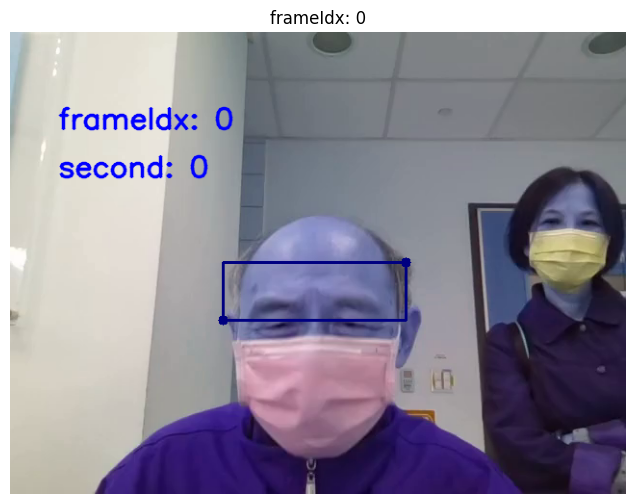

100%|██████████| 750/750 [00:02<00:00, 365.15it/s]


In [15]:
for pid in all_pid_list:
    # bad video: 16, 59
    # if pid==24:
    if pid==38:
        heatmap_dict = {}
        heatmap_dict = FS_read_explanation_from_csv_file(pid, FS_GRADCAM_PATH)
        # FS_show_GradCAM_on_video(pid, VIDEO_PATH, COORDINATE_PATH, heatmap_dict, videoType_dict[pid])
        FS_show_GradCAM_on_video_boundingBox(pid, VIDEO_PATH, COORDINATE_PATH, heatmap_dict, videoType_dict[pid])        

# Tracks

In [18]:
# FS_feature_name = ['lEye_pt2_x', 'lEye_pt2_y', 'lEye_pt3_x', 'lEye_pt3_y', 'rEye_pt1_x', 'rEye_pt1_y', 'rEye_pt2_x', 'rEye_pt2_y', 'rEye_pt3_x', 'rEye_pt3_y']
FS_feature_name = ['lEye_pt2_z', 'lEye_pt3_x', 'lEye_pt3_y', 'lEye_pt3_z', 'rEye_pt1_x', 'rEye_pt1_y', 'rEye_pt1_z', 'rEye_pt2_x', 'rEye_pt2_y', 'rEye_pt2_z', 'rEye_pt3_x', 'rEye_pt3_y', 'rEye_pt3_z']

def read_gradcam_explanation_from_csv_file(target_pid, dir_path):
    heatmap_dict = {}
    for fname in list(os.listdir(dir_path)): ### ex. "37_Segment1.csv"
        pid = int(fname.split("_")[0])       ### ex. 37
        segmentName = fname.split(".")[0].split("_")[1]    ### ex. Segment1

        if pid==target_pid:
            filepath = dir_path + fname      ### ex. "Facial_Model3_0509/FS_Dynamic/GradCAM_heatmap/37_Segment1.csv"
            df = pd.read_csv(filepath, index_col=0, header=None) ### Set first column as index

            heatmap_dict[segmentName] = df
    return heatmap_dict



def get_timestamp_heatmap_value(pid, heatmap_dict):
    segmentNames = list(heatmap_dict.keys())
    segmentNames.sort()
    sorted_dict = {segName: heatmap_dict[segName] for segName in segmentNames}
    heatmap_dict = sorted_dict
    ### ---------------------- Get some info [start] --------------------
    label = label_dict[pid]
    foldIdx = foldIdx_dict[pid]
    threshold = FS_threshold_facial_5f[foldIdx]
    prob_dict = FS_segProb_dict[pid]   ### ex. prob_dict = {'segment_0': 0.876, 'segment_1': 0.9994}
    prob_dict_rename = {}              ### ex. prob_dict_rename = {'Segment0': 0.876, 'Segment1': 0.9994}
    for key in prob_dict:
        prob = prob_dict[key]
        segName = 'Segment' + str(key.split('_')[1])
        prob_dict_rename[segName] = prob
    ### ---------------------- Get some info [end] -----------------------


    # ## --------------------------- draw every segment directly ---------------------------
    n_segment = len(heatmap_dict)
    n_frame = (n_segment-1)*n_GAP + n_PERIOD
    Avg = [0] * n_frame
    Times = [0] * n_frame

    start = 0
    end = n_PERIOD
    for key in heatmap_dict:
        prob = prob_dict_rename[key]
        heatmap = heatmap_dict[key] ### heatmap for one segment

        n_feature, n_timestamp = heatmap.shape[0], heatmap.shape[1] ### 10 features with 300 timestamp
        heatmap = heatmap.iloc[:, :].values

        for i in range(n_timestamp):
            cur_frame = start + i

            left2z = heatmap[0][i]
            left3x, left3y, left3z = heatmap[1][i], heatmap[2][i], heatmap[3][i]
            right1x, right1y, right1z = heatmap[4][i], heatmap[5][i], heatmap[6][i]
            right2x, right2y, right2z = heatmap[7][i], heatmap[8][i], heatmap[9][i]
            right3x, right3y, right3z = heatmap[10][i], heatmap[11][i], heatmap[12][i]
             
            # left2x, left2y, left3x, left3y = heatmap[0][i], heatmap[1][i], heatmap[2][i], heatmap[3][i]
            # right1x, right1y, right2x, right2y, right3x, right3y = heatmap[4][i], heatmap[5][i], heatmap[6][i], heatmap[7][i], heatmap[8][i], heatmap[9][i]

            # avg = (left2x + left2y + left3x + left3y + right1x + right1y + right2x + right2y + right3x + right3y)/10
            avg = max(left2z, left3x, left3y, left3z, right1x, right1y, right1z, right2x, right2y, right2z, right3x, right3y, right3z)

            Avg[cur_frame] += avg
            Times[cur_frame] += 1
                
        start += n_GAP
        end = start + n_PERIOD
        
    for i in range(n_frame):
        if Times[i]!=0:
            Avg[i] = int(Avg[i]/Times[i])

    colorData = []
    for i in range(0, n_frame, 30):
        start = i
        end = min(i+30, n_frame)
        # avg_30 = np.average(Avg[start:end])
        avg_30 = max(Avg[start:end])
        colorData.append(avg_30)
    return colorData


def resize_coordinate_data(data, videoType):
    n_timestamp, n_feature = data.shape[0], data.shape[1]
    
    all_row = []
    if videoType==1:
        ratio = 720/480
        for row_idx in range(n_timestamp):
            one_row = []
            for col_idx in range(n_feature):
                value = data[row_idx][col_idx]
                new_value = round(value*ratio, 2)
                one_row.append(new_value)
            all_row.append(one_row)

    elif videoType==2:
        width_ratio = 960/1280
        for row_idx in range(n_timestamp):
            one_row = []
            for col_idx in range(n_feature):
                if col_idx%2==0: # x-direction
                    value = data[row_idx][col_idx]
                    new_value = round(value*width_ratio, 2)
                else:
                    new_value = data[row_idx][col_idx]
                one_row.append(new_value)
            all_row.append(one_row)
    else:
        print(f'check check check!')
    
    all_row = np.array(all_row)
    return all_row


def get_each_pid_position_in_second_dimension(pidList):
    for idx, pid in enumerate(pidList):
        heatmap_dict = read_gradcam_explanation_from_csv_file(pid, FS_GRADCAM_PATH)
        n_segment = len(heatmap_dict)
        n_frame = (n_segment-1)*n_GAP + n_PERIOD
        
        coord_csv_file = COORDINATE_PATH + str(pid) + '/Description1_20240314/1_raw_coordinate_data.csv'
        if pid>=1 and pid<=9:
            coord_csv_file = COORDINATE_PATH + ("%02d" % pid) + '/Description1_20240314/1_raw_coordinate_data.csv'

        if os.path.exists(coord_csv_file)==False:
            print(f'[pid {pid}] CSV file does NOT exist.')
        else:
            coord_df = pd.read_csv(coord_csv_file, header=None)
            coord_arr = coord_df.iloc[:, :].values ### (xxx, 32) = xxx rows & 32 cols

        coord_arr = resize_coordinate_data(coord_arr, videoType_dict[pid]) ### [update] 20240606

        # [Frame-dimension] Get the center of bounding box ----------------------------------------
        pt_center = []
        pt_centerX, pt_centerY = [], []
        eye_dist = []
        for i in range(n_frame):
            leftMost_x = int(coord_arr[i][26])
            rightMost_x = int(coord_arr[i][10])
            topMost_y = max(int(coord_arr[i][15]), int(coord_arr[i][31]))
            lowMost_y = min(int(coord_arr[i][7]), int(coord_arr[i][23]))
            width = abs(leftMost_x - rightMost_x)
            height = abs(topMost_y - lowMost_y)

            pt_center.append( [int((leftMost_x+rightMost_x)/2), int((topMost_y+lowMost_y)/2)] )
            pt_centerX.append(int((leftMost_x+rightMost_x)/2))
            pt_centerY.append(int((topMost_y+lowMost_y)/2))
            eye_dist.append(int(abs(leftMost_x-rightMost_x)))

        ### Shift to start with position [0, 0] --------------------------------------------------
        xMin, xMax = min(pt_centerX), max(pt_centerX)
        yMin, yMax = min(pt_centerY), max(pt_centerY)
        tmp = xMin/100
        tmp = xMin-tmp
        pt_centerX = [x - tmp for x in pt_centerX]

        tmp = yMin/100
        tmp = yMin-tmp
        pt_centerY = [y - tmp for y in pt_centerY]

        
        ### [Second-dimesion] Get the average center of bounding box per second --------------------------
        start = 0
        end = 30
        pt_centerX_second, pt_centerY_second = [], []
        pt_centerXY_second = []
        eye_dist_second = []
        pt_centerX_second_norm_with_eye_dist_second, pt_centerY_second_norm_with_eye_dist_second = [], []
        pt_centerXY_second_norm_with_eye_dist_second = []
        for i in range(0, n_frame, 30):
            start = i
            end = min(i+30, n_frame)
            # pt_centerX_second.append(np.average(pt_centerX[start:end]))
            # pt_centerY_second.append(np.average(pt_centerY[start:end]))
            # pt_centerXY_second.append([np.average(pt_centerX[start:end]), np.average(pt_centerY[start:end])])
            pt_centerX_second.append(pt_centerX[i])
            pt_centerY_second.append(pt_centerY[i])
            pt_centerXY_second.append([pt_centerX[i], pt_centerY[i]])
            eye_dist_second.append(eye_dist[i])
            pt_centerX_second_norm_with_eye_dist_second.append(pt_centerX[i]/eye_dist[i])
            pt_centerY_second_norm_with_eye_dist_second.append(pt_centerY[i]/eye_dist[i])
            pt_centerXY_second_norm_with_eye_dist_second.append([pt_centerX[i]/eye_dist[i], pt_centerY[i]/eye_dist[i]])
 
        ### Get the center of all second ----------------------------------------------------------------
        fig_centerX = np.average(pt_centerX_second)
        fig_centerY = np.average(pt_centerY_second)
        fig_centerX_norm = np.average(pt_centerX_second_norm_with_eye_dist_second)
        fig_centerY_norm = np.average(pt_centerY_second_norm_with_eye_dist_second)
        
        pt_centerXY_dict[pid] = {}
        pt_centerXY_dict[pid]['fig_centerX'] = fig_centerX
        pt_centerXY_dict[pid]['fig_centerY'] = fig_centerY
        pt_centerXY_dict[pid]['pt_position'] = pt_centerXY_second
        pt_centerXY_dict[pid]['eye_distance'] = eye_dist_second
        pt_centerXY_dict[pid]['fig_centerX_norm_with_eye_dist'] = fig_centerX_norm
        pt_centerXY_dict[pid]['fig_centerY_norm_with_eye_dist'] = fig_centerY_norm
        pt_centerXY_dict[pid]['pt_position_norm_with_eye_dist'] = pt_centerXY_second_norm_with_eye_dist_second


def get_center_position_of_figure_visualization(pt_dict):
    pt_x, pt_y = [], []
    for pid in pt_dict:
        pt_x.append(pt_dict[pid]['fig_centerX'])
        pt_y.append(pt_dict[pid]['fig_centerY'])
    all_pid_fig_centerX = np.average(pt_x)
    all_pid_fig_centerY = np.average(pt_y)
    print(f'all_pid_fig_centerX: {all_pid_fig_centerX}')
    print(f'all_pid_fig_centerY: {all_pid_fig_centerY}')
    
    for pid in pt_dict:
        original_centerX = pt_dict[pid]['fig_centerX']
        original_centerY = pt_dict[pid]['fig_centerY']

        shiftX = all_pid_fig_centerX - original_centerX
        shiftY = all_pid_fig_centerY - original_centerY

        data = pt_dict[pid]['pt_position']
        new_data = []
        for position in data:
            x = position[0]
            y = position[1]

            new_x = x + shiftX
            new_y = y + shiftY
            new_data.append([new_x, new_y])
        pt_centerXY_dict[pid]['new_pt_position'] = new_data
        
def get_center_position_of_figure_visualization_norm_with_eye_distance(pt_dict):
    pt_x, pt_y = [], []
    for pid in pt_dict:
        pt_x.append(pt_dict[pid]['fig_centerX_norm_with_eye_dist'])
        pt_y.append(pt_dict[pid]['fig_centerY_norm_with_eye_dist'])
    all_pid_fig_centerX = np.average(pt_x)
    all_pid_fig_centerY = np.average(pt_y)
    print(f'(norm) all_pid_fig_centerX: {all_pid_fig_centerX}')
    print(f'(norm) all_pid_fig_centerY: {all_pid_fig_centerY}')
    
    ### Set (0, 0) as the center ------------------------------
    all_pid_fig_centerX = 0
    all_pid_fig_centerY = 0
    
    for pid in pt_dict:
        original_centerX = pt_dict[pid]['fig_centerX_norm_with_eye_dist']
        original_centerY = pt_dict[pid]['fig_centerY_norm_with_eye_dist']

        shiftX = all_pid_fig_centerX - original_centerX
        shiftY = all_pid_fig_centerY - original_centerY

        data = pt_dict[pid]['pt_position_norm_with_eye_dist']
        new_data = []
        for position in data:
            x = position[0]
            y = position[1]

            new_x = x + shiftX
            new_y = y + shiftY
            new_data.append([new_x, new_y])
        pt_centerXY_dict[pid]['new_pt_position_norm_with_eye_dist'] = new_data
    

In [19]:
pt_centerXY_dict = {}

get_each_pid_position_in_second_dimension(all_pid_list)
get_center_position_of_figure_visualization(pt_centerXY_dict)
get_center_position_of_figure_visualization_norm_with_eye_distance(pt_centerXY_dict)

all_pid_fig_centerX: 67.23100362124259
all_pid_fig_centerY: 38.56326522741964
(norm) all_pid_fig_centerX: 0.42930861969217277
(norm) all_pid_fig_centerY: 0.24379064484695925


## 0620 

---------------------------------------------------------------------- [Pid 5] ----------------------------------------------------------------------


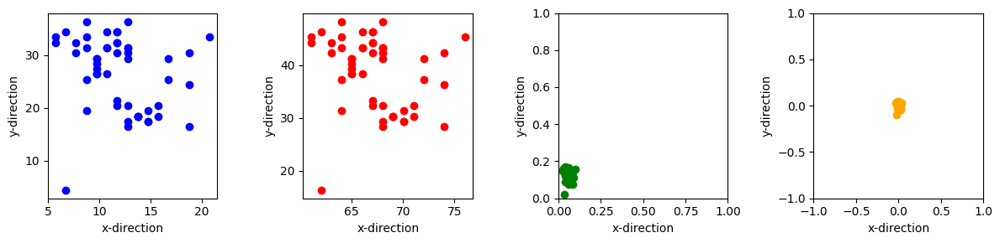

---------------------------------------------------------------------- [Pid 20] ----------------------------------------------------------------------


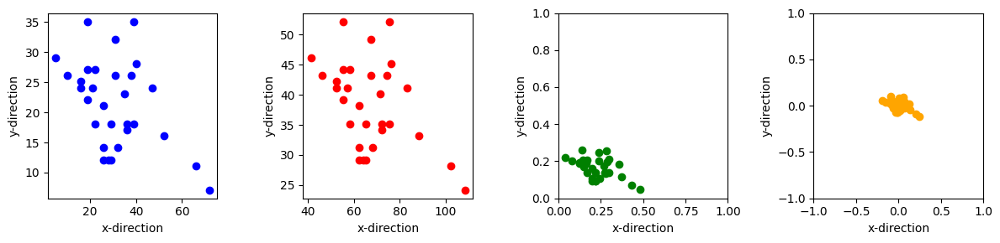

---------------------------------------------------------------------- [Pid 43] ----------------------------------------------------------------------


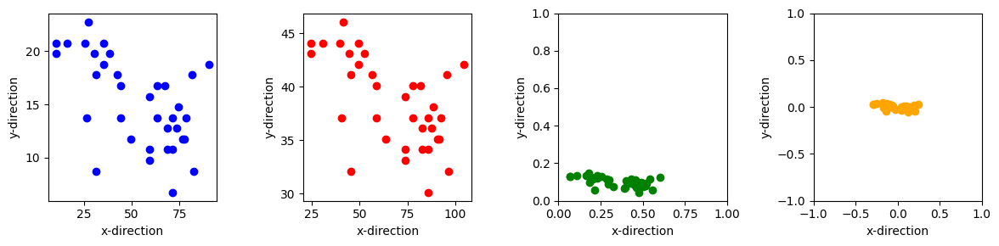

In [20]:
def show_coordinate_process_result(pidList):
    for pid in pidList:
        if pid==5 or pid==20 or pid==43:
            print(f'---------------------------------------------------------------------- [Pid {pid}] ----------------------------------------------------------------------')
            plt.figure(figsize=(12, 3))
            
            pt_position = pt_centerXY_dict[pid]['pt_position']
            new_pt_position = pt_centerXY_dict[pid]['new_pt_position']
            norm_pt_position = pt_centerXY_dict[pid]['pt_position_norm_with_eye_dist']
            new_norm_pt_position = pt_centerXY_dict[pid]['new_pt_position_norm_with_eye_dist']
    
            plt.subplot(1, 4, 1)
            x = [pt[0] for pt in pt_position]
            y = [pt[1] for pt in pt_position]
            plt.scatter(x, y, c='blue')
            plt.xlabel(f'x-direction')
            plt.ylabel(f'y-direction')
            
            plt.subplot(1, 4, 2)
            x = [pt[0] for pt in new_pt_position]
            y = [pt[1] for pt in new_pt_position]
            plt.scatter(x, y, c='red')
            plt.xlabel(f'x-direction')
            plt.ylabel(f'y-direction')
            
            plt.subplot(1, 4, 3)
            x = [pt[0] for pt in norm_pt_position]
            y = [pt[1] for pt in norm_pt_position]
            plt.scatter(x, y, c='green')
            plt.xlim([0, 1])
            plt.ylim([0, 1])
            plt.xlabel(f'x-direction')
            plt.ylabel(f'y-direction')
            
            plt.subplot(1, 4, 4)
            x = [pt[0] for pt in new_norm_pt_position]
            y = [pt[1] for pt in new_norm_pt_position]
            plt.scatter(x, y, c='orange')
            plt.xlim([-1, 1])
            plt.ylim([-1, 1])
            plt.xlabel(f'x-direction')
            plt.ylabel(f'y-direction')

            plt.tight_layout()
            plt.show()    
show_coordinate_process_result(all_pid_list)

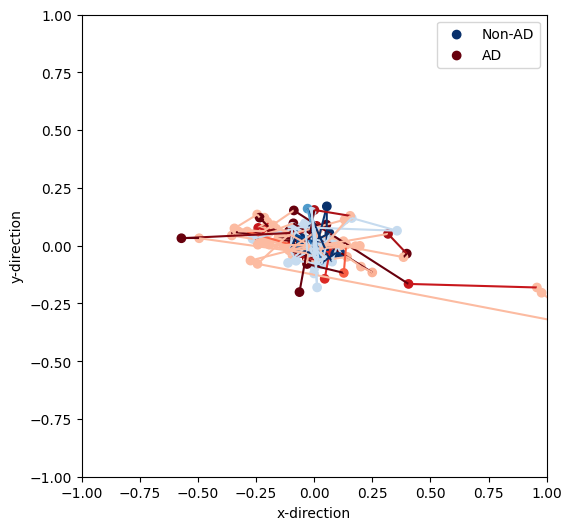

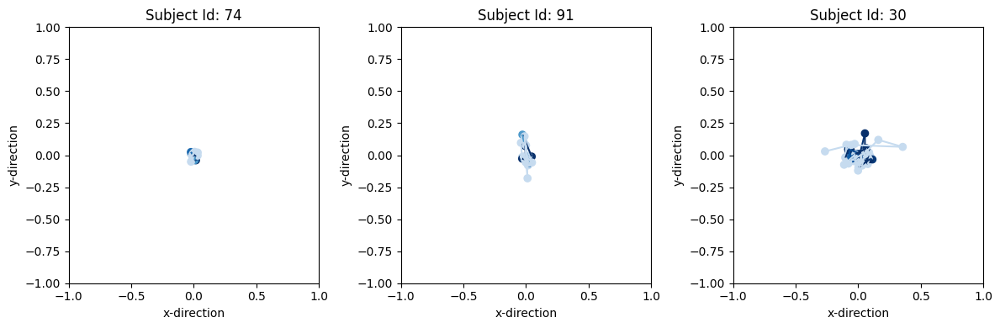

In [31]:
colorData_dict = {}

def show_all_pid_head_movement_track_norm_with_eye_distance(pidList, mode):
    if mode=="subplot":
        plt.figure(figsize=(18, 45))

        for idx, pid in enumerate(pidList):
            # plt.subplot(15, 6, idx+1)
            ax = plt.subplot(15, 6, idx+1)

            # if pid==1:
            label = label_dict[pid]

            ### Get each timestamp heatmap value ---------------------------------------------------
            heatmap_dict = read_gradcam_explanation_from_csv_file(pid, FS_GRADCAM_PATH)
            colorData = get_timestamp_heatmap_value(pid, heatmap_dict)
            n_valid_timestamp = len(colorData)
            colorData_dict[pid] = colorData

            ### Get coordinate data --------------------------------------------------------------------
            data = pt_centerXY_dict[pid]['new_pt_position_norm_with_eye_dist']
            positionX = []
            positionY = []
            for position in data:
                positionX.append(position[0])
                positionY.append(position[1])

            ### Greate Line Segments ------------------------------------------------------------------
            points = np.array([positionX, positionY]).T.reshape(-1, 1, 2)
            segments = np.concatenate([points[:-1], points[1:]], axis=1)

            if label==0:
                norm = plt.Normalize(0, 255)
                lc = LineCollection(segments, cmap='Blues', norm=norm)
                lc.set_array(colorData)
                ax.add_collection(lc)
                plt.scatter(positionX, positionY, c=colorData, cmap='Blues')
            if label==1:
                norm = plt.Normalize(0, 255)
                lc = LineCollection(segments, cmap='Reds', norm=norm)
                lc.set_array(colorData)
                ax.add_collection(lc)
                plt.scatter(positionX, positionY, c=colorData, cmap='Reds')
            plt.xlabel(f'x-direction')
            plt.ylabel(f'y-direction')
            plt.xlim([-1, 1])
            plt.ylim([-1, 1])
            plt.title(f'[Pid {pid}]')
        plt.tight_layout()
        plt.show()
        
    if mode=="one figure (all subjects)":
        fig, ax = plt.subplots(figsize=(6, 6))
        
        for idx, pid in enumerate(pidList):
            label = label_dict[pid]
            ### Get each timestamp heatmap value ---------------------------------------------------
            heatmap_dict = read_gradcam_explanation_from_csv_file(pid, FS_GRADCAM_PATH)
            colorData = get_timestamp_heatmap_value(pid, heatmap_dict)
            n_valid_timestamp = len(colorData)
            colorData_dict[pid] = colorData

            ### Get coordinate data --------------------------------------------------------------------
            data = pt_centerXY_dict[pid]['new_pt_position_norm_with_eye_dist']
            positionX = []
            positionY = []
            for position in data:
                positionX.append(position[0])
                positionY.append(position[1])

            ### Greate Line Segments ------------------------------------------------------------------
            points = np.array([positionX, positionY]).T.reshape(-1, 1, 2)
            segments = np.concatenate([points[:-1], points[1:]], axis=1)

            if label==0:
                norm = plt.Normalize(0, 255)
                lc = LineCollection(segments, cmap='Blues', norm=norm)
                lc.set_array(colorData)
                ax.add_collection(lc)
                plt.scatter(positionX, positionY, c=colorData, cmap='Blues', label='Non-AD')
            if label==1:
                norm = plt.Normalize(0, 255)
                lc = LineCollection(segments, cmap='Reds', norm=norm)
                lc.set_array(colorData)
                ax.add_collection(lc)
                plt.scatter(positionX, positionY, c=colorData, cmap='Reds', label='AD')
        
        plt.xlabel(f'x-direction')
        plt.ylabel(f'y-direction')
        plt.xlim([-1, 1])
        plt.ylim([-1, 1])
        handles, labels = ax.get_legend_handles_labels()
        unique = [(h, l) for i, (h, l) in enumerate(zip(handles, labels)) if l not in labels[:i]]
        ax.legend(*zip(*unique))
        plt.show()
    
    if mode=="one figure":
        # plt.figure(figsize=(18, 18))
        fig, ax = plt.subplots(figsize=(6, 6))
        
        # target_pid_list = [90, 5, 43, 20, 27, 9]
        target_pid_list = [74, 91, 30, 20, 27, 38]

        for idx, pid in enumerate(pidList):
            if pid in target_pid_list:
                label = label_dict[pid]
                ### Get each timestamp heatmap value ---------------------------------------------------
                heatmap_dict = read_gradcam_explanation_from_csv_file(pid, FS_GRADCAM_PATH)
                colorData = get_timestamp_heatmap_value(pid, heatmap_dict)
                n_valid_timestamp = len(colorData)
                colorData_dict[pid] = colorData

                ### Get coordinate data --------------------------------------------------------------------
                data = pt_centerXY_dict[pid]['new_pt_position_norm_with_eye_dist']
                positionX = []
                positionY = []
                for position in data:
                    positionX.append(position[0])
                    positionY.append(position[1])

                ### Greate Line Segments ------------------------------------------------------------------
                points = np.array([positionX, positionY]).T.reshape(-1, 1, 2)
                segments = np.concatenate([points[:-1], points[1:]], axis=1)

                if label==0:
                    color_map = mpl.colormaps['Blues']
                    color_map = ListedColormap(color_map(np.linspace(0.25, 1.0, 192)))
                    norm = plt.Normalize(0, 255)
                    lc = LineCollection(segments, cmap=color_map, norm=norm)
                    lc.set_array(colorData)
                    ax.add_collection(lc)
                    p1 = plt.scatter(positionX, positionY, c=colorData, cmap=color_map, label='Non-AD')
                if label==1:
                    color_map = mpl.colormaps['Reds']
                    color_map = ListedColormap(color_map(np.linspace(0.25, 1.0, 192)))
                    norm = plt.Normalize(0, 255)
                    lc = LineCollection(segments, cmap=color_map, norm=norm)
                    lc.set_array(colorData)
                    ax.add_collection(lc)
                    p2 = plt.scatter(positionX, positionY, c=colorData, cmap=color_map, label='AD')
        plt.xlabel(f'x-direction')
        plt.ylabel(f'y-direction')
        plt.xlim([-1, 1])
        plt.ylim([-1, 1])
        # plt.legend()
        
        # cbar_NonAD = plt.colorbar(p1, location='right')
        # cbar_AD = plt.colorbar(p2, location='left')
        # cbar_NonAD.set_label('Non-AD', fontsize=14)
        # cbar_AD.set_label('AD', fontsize=14)

        legend = plt.legend([p1, p2], ["Non-AD", "AD"])
        leg = ax.get_legend()
        hl_dict = {handle.get_label(): handle for handle in leg.legend_handles}
        # hl_dict['Non-AD'].set_color('blue')
        # hl_dict['AD'].set_color('red')
        
        # handles, labels = ax.get_legend_handles_labels()
        # unique = [(h, l) for i, (h, l) in enumerate(zip(handles, labels)) if l not in labels[:i]]
        # ax.legend(*zip(*unique))
        # leg = ax.get_legend()
        # hl_dict = {handle.get_label(): handle for handle in leg.legend_handles}
        # hl_dict['Non-AD'].set_color('blue')
        # hl_dict['AD'].set_color('red')
        
        # import matplotlib.patches as mpatches
        # red_AD = mpatches.Patch(color='red', label='AD')
        # blue_nonAD = mpatches.Patch(color='blue', label='Non-AD')
        # ax.legend(handles=[red_AD, blue_nonAD])
        
        plt.show()
        
    if mode=="specific cases":
        plt.figure(figsize=(12, 4))

        # target_pid_list = [90, 5, 43, 20, 27, 9]
        # target_pid_list = [90, 5, 43]
        # target_pid_list = [20, 27, 9]

        # target_pid_list = [20, 27, 38]
        target_pid_list = [74, 91, 30]

        for idx, pid in enumerate(target_pid_list):
            ax = plt.subplot(1, 3, idx+1)

            # fig, ax = plt.subplots(figsize=(5, 5))

            label = label_dict[pid]
            ### Get each timestamp heatmap value ---------------------------------------------------
            heatmap_dict = read_gradcam_explanation_from_csv_file(pid, FS_GRADCAM_PATH)
            colorData = get_timestamp_heatmap_value(pid, heatmap_dict)
            n_valid_timestamp = len(colorData)
            colorData_dict[pid] = colorData

            ### Get coordinate data --------------------------------------------------------------------
            data = pt_centerXY_dict[pid]['new_pt_position_norm_with_eye_dist']
            positionX = []
            positionY = []
            for position in data:
                positionX.append(position[0])
                positionY.append(position[1])

            ### Greate Line Segments ------------------------------------------------------------------
            points = np.array([positionX, positionY]).T.reshape(-1, 1, 2)
            segments = np.concatenate([points[:-1], points[1:]], axis=1)

            if label==0:
                color_map = mpl.colormaps['Blues']
                color_map = ListedColormap(color_map(np.linspace(0.25, 1.0, 192)))
                norm = plt.Normalize(0, 255)
                lc = LineCollection(segments, cmap=color_map, norm=norm)
                lc.set_array(colorData)
                ax.add_collection(lc)
                plt.scatter(positionX, positionY, c=colorData, cmap=color_map)
            if label==1:
                color_map = mpl.colormaps['Reds']
                color_map = ListedColormap(color_map(np.linspace(0.25, 1.0, 192)))
                norm = plt.Normalize(0, 255)
                lc = LineCollection(segments, cmap=color_map, norm=norm)
                lc.set_array(colorData)
                ax.add_collection(lc)
                plt.scatter(positionX, positionY, c=colorData, cmap=color_map)
            plt.xlabel(f'x-direction')
            plt.ylabel(f'y-direction')
            plt.title(f'Subject Id: {pid}')
            plt.xlim([-1, 1])
            plt.ylim([-1, 1])
        # plt.colorbar()
        plt.tight_layout()
        plt.show()
            
            
    if mode=="specific cases (solid line)":
        target_pid_list = [27]
        for pid in target_pid_list:
            fig, ax = plt.subplots(figsize=(5, 5))
            label = label_dict[pid]
            ### Get each timestamp heatmap value ---------------------------------------------------
            heatmap_dict = read_gradcam_explanation_from_csv_file(pid, FS_GRADCAM_PATH)
            colorData = get_timestamp_heatmap_value(pid, heatmap_dict)
            n_valid_timestamp = len(colorData)
            colorData_dict[pid] = colorData

            ### Get coordinate data --------------------------------------------------------------------
            data = pt_centerXY_dict[pid]['new_pt_position_norm_with_eye_dist']
            positionX = []
            positionY = []
            for position in data:
                positionX.append(position[0])
                positionY.append(position[1])

            ### Greate Line Segments ------------------------------------------------------------------
            points = np.array([positionX, positionY]).T.reshape(-1, 1, 2)
            segments = np.concatenate([points[:-1], points[1:]], axis=1)

            if label==0:
                # norm = plt.Normalize(0, 255)
                # lc = LineCollection(segments, cmap='Blues', norm=norm)
                # lc.set_array(colorData)
                # ax.add_collection(lc)
                plt.plot(positionX, positionY, color='lightgray')
                plt.scatter(positionX, positionY, c=colorData, cmap='Blues')
            if label==1:
                # norm = plt.Normalize(0, 255)
                # lc = LineCollection(segments, cmap='Reds', norm=norm)
                # lc.set_array(colorData)
                # ax.add_collection(lc)
                plt.plot(positionX, positionY, color='lightgray')
                plt.scatter(positionX, positionY, c=colorData, cmap='Reds')
            plt.xlabel(f'x-direction')
            plt.ylabel(f'y-direction')
            plt.xlim([-1, 1])
            plt.ylim([-1, 1])
            plt.title(f'[Pid {pid}]')
            plt.show()
        
    
# show_all_pid_head_movement_track_norm_with_eye_distance(all_pid_list, "subplot")
# show_all_pid_head_movement_track_norm_with_eye_distance(all_pid_list, "one figure (all subjects)")
show_all_pid_head_movement_track_norm_with_eye_distance(all_pid_list, "one figure")
show_all_pid_head_movement_track_norm_with_eye_distance(all_pid_list, "specific cases")
# show_all_pid_head_movement_track_norm_with_eye_distance(all_pid_list, "specific cases (solid line)")

## Normalize

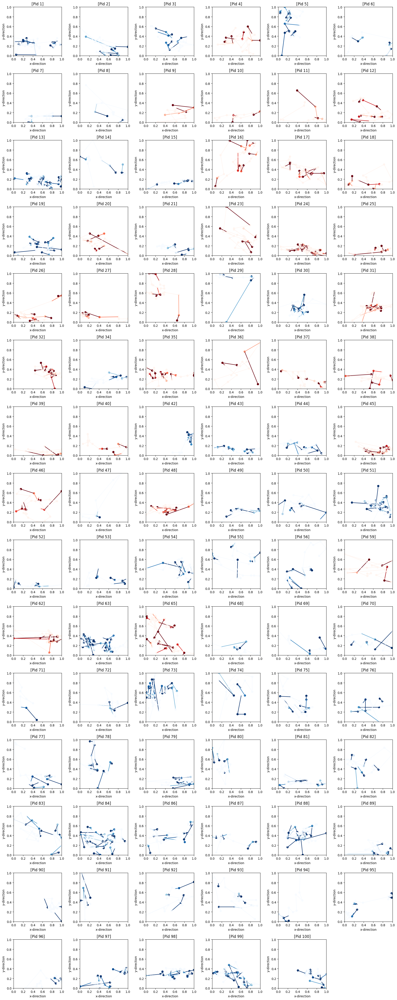

In [72]:
colorData_dict = {}

def show_all_pid_head_movement_track_with_GradCAM_normalized(pidList):
    plt.figure(figsize=(18, 45))

    for idx, pid in enumerate(pidList):
        # plt.subplot(15, 6, idx+1)
        ax = plt.subplot(15, 6, idx+1)
        
        # if pid==1:
        label = label_dict[pid]

        ### Get each timestamp heatmap value ---------------------------------------------------
        heatmap_dict = read_gradcam_explanation_from_csv_file(pid, FS_GRADCAM_PATH)
        colorData = get_timestamp_heatmap_value(pid, heatmap_dict)
        n_valid_timestamp = len(colorData)
        colorData_dict[pid] = colorData

        ### Get coordinate data --------------------------------------------------------------------
        data = pt_centerXY_dict[pid]['pt_position']
        positionX = []
        positionY = []
        for position in data:
            positionX.append(position[0])
            positionY.append(position[1])

        ### Normalize coordinate data --------------------------------------------------------------
        tmp_x = np.array(positionX)
        tmp_y = np.array(positionY)
        tmp_xy = np.concatenate((tmp_x.reshape(-1, 1), tmp_y.reshape(-1, 1)), axis=0)
        scaler = MinMaxScaler()
        scaler.fit(tmp_xy)
        positionX_normalized = scaler.transform(tmp_x.reshape(-1, 1)).flatten()
        positionY_normalized = scaler.transform(tmp_y.reshape(-1, 1)).flatten()


        ### Greate Line Segments ------------------------------------------------------------------
        points = np.array([positionX_normalized, positionY_normalized]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)

        if label==0:
            norm = plt.Normalize(0, 255)
            lc = LineCollection(segments, cmap='Blues', norm=norm)
            lc.set_array(colorData)
            ax.add_collection(lc)
            plt.scatter(positionX_normalized, positionY_normalized, c=colorData, cmap='Blues')
        if label==1:
            norm = plt.Normalize(0, 255)
            lc = LineCollection(segments, cmap='Reds', norm=norm)
            lc.set_array(colorData)
            ax.add_collection(lc)
            plt.scatter(positionX_normalized, positionY_normalized, c=colorData, cmap='Reds')
        plt.xlabel(f'x-direction')
        plt.ylabel(f'y-direction')
        plt.xlim([0, 1])
        plt.ylim([0, 1])
        plt.title(f'[Pid {pid}]')

        # if label==0:
        #     plt.plot(positionX, positionY, color='lightgray')
        #     plt.scatter(positionX, positionY, c=colorData, cmap='Blues')
        # if label==1:
        #     plt.plot(positionX, positionY, color='lightgray')
        #     plt.scatter(positionX, positionY, c=colorData, cmap='Reds')
        # plt.xlabel(f'x-direction')
        # plt.ylabel(f'y-direction')
        # # plt.xlim([-250, 350])
        # # plt.ylim([-150, 250])
        # plt.title(f'[Pid {pid}]')
        
    plt.tight_layout()
    plt.show()
    
    
show_all_pid_head_movement_track_with_GradCAM_normalized(all_pid_list)

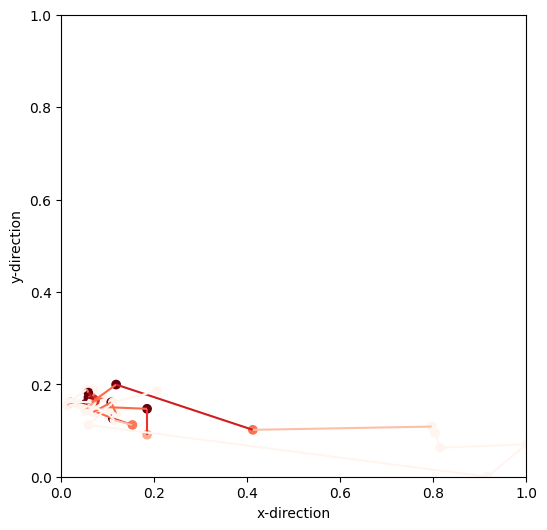

In [76]:
def show_head_movement_track_with_GradCAM_normalized_oneFigure(pidList):
    fig = plt.figure(figsize=(6, 6))
    ax = fig.add_subplot(1, 1, 1)

    for idx, pid in enumerate(pidList):
        label = label_dict[pid]

        ### Get each timestamp heatmap value ---------------------------------------------------
        heatmap_dict = read_gradcam_explanation_from_csv_file(pid, FS_GRADCAM_PATH)
        colorData = get_timestamp_heatmap_value(pid, heatmap_dict)
        n_valid_timestamp = len(colorData)
        colorData_dict[pid] = colorData

        ### Get coordinate data --------------------------------------------------------------------
        data = pt_centerXY_dict[pid]['pt_position']
        positionX = []
        positionY = []
        for position in data:
            positionX.append(position[0])
            positionY.append(position[1])

        ### Normalize coordinate data --------------------------------------------------------------
        tmp_x = np.array(positionX)
        tmp_y = np.array(positionY)
        tmp_xy = np.concatenate((tmp_x.reshape(-1, 1), tmp_y.reshape(-1, 1)), axis=0)
        scaler = MinMaxScaler()
        scaler.fit(tmp_xy)
        positionX_normalized = scaler.transform(tmp_x.reshape(-1, 1)).flatten()
        positionY_normalized = scaler.transform(tmp_y.reshape(-1, 1)).flatten()

        ### Greate Line Segments ------------------------------------------------------------------
        points = np.array([positionX_normalized, positionY_normalized]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        colorData_segments = []
        for i in range(len(colorData)-1):
            colorData_segments.append(int((colorData[i]+colorData[i+1])/2))
        colorData_segments = np.array(colorData_segments)

        if label==0:
            norm = plt.Normalize(0, 255)
            lc = LineCollection(segments, cmap='Blues', norm=norm)
            # lc.set_array(colorData)
            lc.set_array(colorData_segments)
            ax.add_collection(lc)
            plt.scatter(positionX_normalized, positionY_normalized, c=colorData, cmap='Blues')
        if label==1:
            norm = plt.Normalize(0, 255)
            lc = LineCollection(segments, cmap='Reds', norm=norm)
            # lc.set_array(colorData)
            lc.set_array(colorData_segments)
            ax.add_collection(lc)
            plt.scatter(positionX_normalized, positionY_normalized, c=colorData, cmap='Reds')
    plt.xlabel(f'x-direction')
    plt.ylabel(f'y-direction')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.show()
    
### High blink rate: 42
# toDraw_CN_pid_list = [90, 5, 43] ### (weighted conf)+(weighted prob)
# toDraw_CN_pid_list = [91, 7, 90]   ### (average prob)+(weighted prob)
# toDraw_CN_pid_list = [90, 5, 43]
# show_head_movement_track_with_GradCAM_normalized_oneFigure(toDraw_CN_pid_list)

### Bad video quality: 16, 28
# toDraw_AD_pid_list = [20, 27] ### (weighted conf)+(weighted prob)
# toDraw_AD_pid_list = [20, 9]    ### (average prob)+(weighted prob)
toDraw_AD_pid_list = [27]
show_head_movement_track_with_GradCAM_normalized_oneFigure(toDraw_AD_pid_list)

# toDraw_CNandAD_pid_list = [90, 5, 42, 43, 20, 28, 27] ### (weighted conf)+(weighted prob)
# toDraw_CNandAD_pid_list = [42, 91, 7, 90, 20, 28, 9]    ### (average prob)+(weighted prob)
# toDraw_CNandAD_pid_list = [90, 5, 43, 20, 27, 9]
# show_head_movement_track_with_GradCAM_normalized_oneFigure(toDraw_CNandAD_pid_list)

## Centering

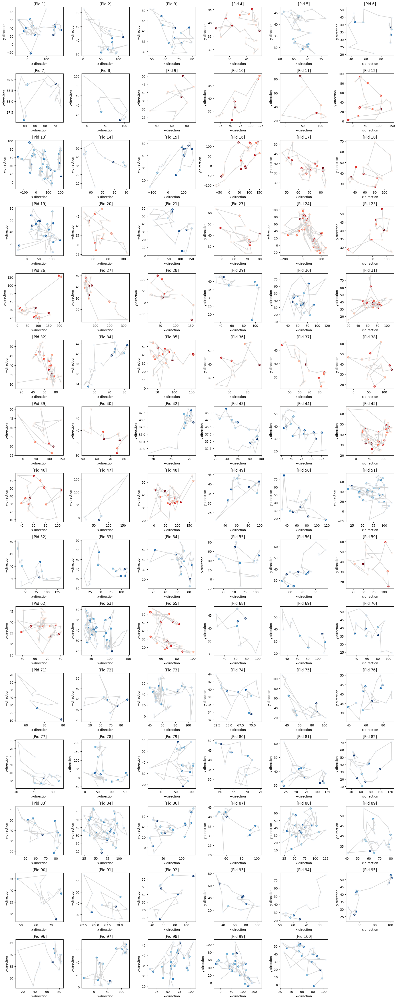

In [36]:
colorData_dict = {}

def show_all_pid_head_movement_track_with_GradCAM_center(pidList):
    plt.figure(figsize=(18, 45))

    for idx, pid in enumerate(pidList):
        plt.subplot(15, 6, idx+1)
        
        # if pid==1:
        label = label_dict[pid]

        ### Get each timestamp heatmap value ---------------------------------------------------
        heatmap_dict = read_gradcam_explanation_from_csv_file(pid, FS_GRADCAM_PATH)
        colorData = get_timestamp_heatmap_value(pid, heatmap_dict)
        n_valid_timestamp = len(colorData)
        colorData_dict[pid] = colorData

        ### Get coordinate data --------------------------------------------------------------------
        data = pt_centerXY_dict[pid]['new_pt_position']
        positionX = []
        positionY = []
        for position in data:
            positionX.append(position[0])
            positionY.append(position[1])

        if label==0:
            # plt.plot(positionX, positionY, '-o',  color='blue')
            plt.plot(positionX, positionY, color='lightgray')
            plt.scatter(positionX, positionY, c=colorData, cmap='Blues')
        if label==1:
            # plt.plot(positionX, positionY, '-o', color='red')
            plt.plot(positionX, positionY, color='lightgray')
            plt.scatter(positionX, positionY, c=colorData, cmap='Reds')
        plt.xlabel(f'x-direction')
        plt.ylabel(f'y-direction')
        # plt.xlim([-250, 350])
        # plt.ylim([-150, 250])
        plt.title(f'[Pid {pid}]')
        
    plt.tight_layout()
    plt.show()
    
    
show_all_pid_head_movement_track_with_GradCAM_center(all_pid_list)

## Fixed Figure Size

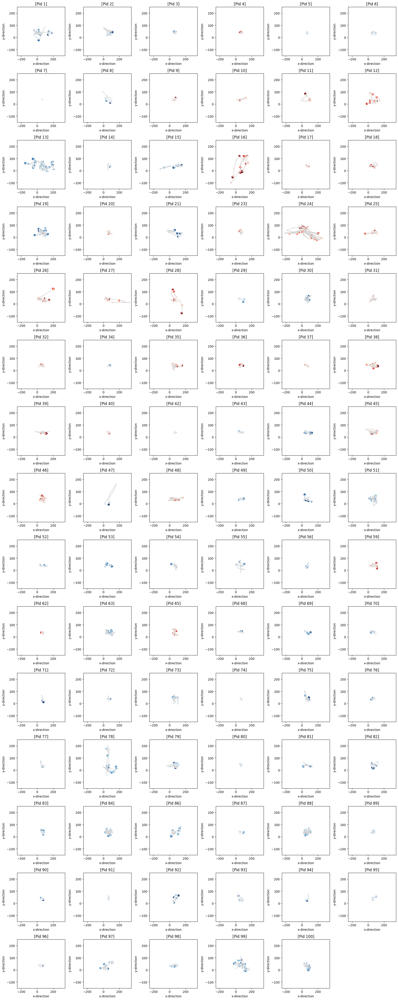

In [37]:
colorData_dict = {}

def show_all_pid_head_movement_track_with_GradCAM_fixedSize(pidList):
    plt.figure(figsize=(18, 45))

    for idx, pid in enumerate(pidList):
        plt.subplot(15, 6, idx+1)
        
        # if pid==1:
        label = label_dict[pid]

        ### Get each timestamp heatmap value ---------------------------------------------------
        heatmap_dict = read_gradcam_explanation_from_csv_file(pid, FS_GRADCAM_PATH)
        colorData = get_timestamp_heatmap_value(pid, heatmap_dict)
        n_valid_timestamp = len(colorData)
        colorData_dict[pid] = colorData

        ### Get coordinate data --------------------------------------------------------------------
        data = pt_centerXY_dict[pid]['new_pt_position']
        positionX = []
        positionY = []
        for position in data:
            positionX.append(position[0])
            positionY.append(position[1])

        # plt.figure(figsize=(5, 5))
        if label==0:
            # plt.plot(positionX, positionY, '-o',  color='blue')
            plt.plot(positionX, positionY, color='lightgray')
            plt.scatter(positionX, positionY, c=colorData, cmap='Blues')
        if label==1:
            # plt.plot(positionX, positionY, '-o', color='red')
            plt.plot(positionX, positionY, color='lightgray')
            plt.scatter(positionX, positionY, c=colorData, cmap='Reds')
        plt.xlabel(f'x-direction')
        plt.ylabel(f'y-direction')
        plt.xlim([-250, 350])
        plt.ylim([-150, 250])
        plt.title(f'[Pid {pid}]')
        # plt.show()
        
    plt.tight_layout()
    plt.show()
    
    
    
show_all_pid_head_movement_track_with_GradCAM_fixedSize(all_pid_list)

## Normalize (centering)

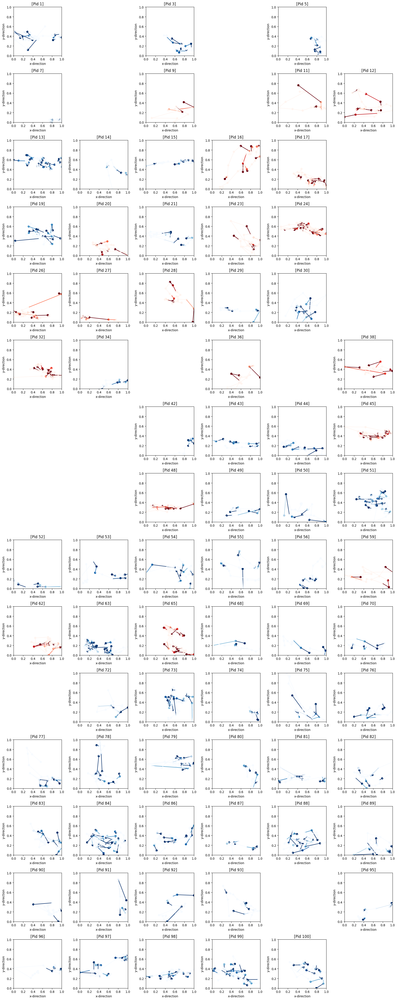

In [18]:
colorData_dict = {}

def show_all_pid_head_movement_track_with_GradCAM_center_normalized(pidList):
    plt.figure(figsize=(18, 45))

    for idx, pid in enumerate(pidList):
        label = label_dict[pid]
        pred_label = pred_label_dict[pid]
        
        if pred_label==label:
            # plt.subplot(15, 6, idx+1)
            ax = plt.subplot(15, 6, idx+1)


            ### Get each timestamp heatmap value ---------------------------------------------------
            heatmap_dict = read_gradcam_explanation_from_csv_file(pid, FS_GRADCAM_PATH)
            colorData = get_timestamp_heatmap_value(pid, heatmap_dict)
            n_valid_timestamp = len(colorData)
            colorData_dict[pid] = colorData

            ### Get coordinate data --------------------------------------------------------------------
            data = pt_centerXY_dict[pid]['new_pt_position']
            positionX = []
            positionY = []
            for position in data:
                positionX.append(position[0])
                positionY.append(position[1])

            ### Normalize coordinate data --------------------------------------------------------------
            tmp_x = np.array(positionX)
            tmp_y = np.array(positionY)
            tmp_xy = np.concatenate((tmp_x.reshape(-1, 1), tmp_y.reshape(-1, 1)), axis=0)
            scaler = MinMaxScaler()
            scaler.fit(tmp_xy)
            positionX_normalized = scaler.transform(tmp_x.reshape(-1, 1)).flatten()
            positionY_normalized = scaler.transform(tmp_y.reshape(-1, 1)).flatten()

            ### Greate Line Segments ------------------------------------------------------------------
            points = np.array([positionX_normalized, positionY_normalized]).T.reshape(-1, 1, 2)
            segments = np.concatenate([points[:-1], points[1:]], axis=1)

            if label==0:
                norm = plt.Normalize(0, 255)
                lc = LineCollection(segments, cmap='Blues', norm=norm)
                lc.set_array(colorData)
                ax.add_collection(lc)
                plt.scatter(positionX_normalized, positionY_normalized, c=colorData, cmap='Blues')
            if label==1:
                norm = plt.Normalize(0, 255)
                lc = LineCollection(segments, cmap='Reds', norm=norm)
                lc.set_array(colorData)
                ax.add_collection(lc)
                plt.scatter(positionX_normalized, positionY_normalized, c=colorData, cmap='Reds')
            plt.xlabel(f'x-direction')
            plt.ylabel(f'y-direction')
            plt.xlim([0, 1])
            plt.ylim([0, 1])
            plt.title(f'[Pid {pid}]')

            # # plt.figure(figsize=(5, 5))
            # if label==0:
            #     # plt.plot(positionX_normalized, positionY_normalized, '-o',  color='blue')
            #     plt.plot(positionX_normalized, positionY_normalized, color='lightgray')
            #     plt.scatter(positionX_normalized, positionY_normalized, c=colorData, cmap='Blues')
            # if label==1:
            #     # plt.plot(positionX_normalized, positionY_normalized, '-o', color='red')
            #     plt.plot(positionX_normalized, positionY_normalized, color='lightgray')
            #     plt.scatter(positionX_normalized, positionY_normalized, c=colorData, cmap='Reds')
            # plt.xlabel(f'x-direction')
            # plt.ylabel(f'y-direction')
            # plt.xlim([0, 1])
            # plt.ylim([0, 1])
            # plt.title(f'[Pid {pid}]')
            # # plt.show()
        
    plt.tight_layout()
    plt.show()
    
    
    
show_all_pid_head_movement_track_with_GradCAM_center_normalized(all_pid_list)

## In one Figure

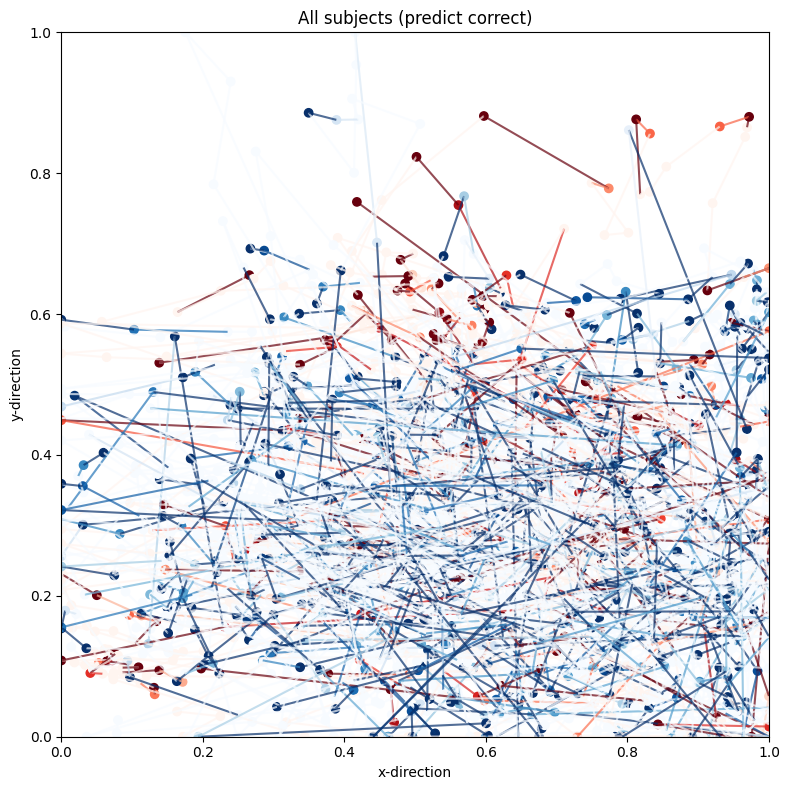

In [42]:
colorData_dict = {}

def show_all_pid_head_movement_track_with_GradCAM_normalized_oneFigure(pidList):
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(1, 1, 1)
    # fig, ax = plt.subplots(1, 1)
    
    
    for idx, pid in enumerate(pidList):
        label = label_dict[pid]
        pred_label = pred_label_dict[pid]
        
        if pred_label==label:
            ### Get each timestamp heatmap value ---------------------------------------------------
            heatmap_dict = read_gradcam_explanation_from_csv_file(pid, FS_GRADCAM_PATH)
            colorData = get_timestamp_heatmap_value(pid, heatmap_dict)
            n_valid_timestamp = len(colorData)
            colorData_dict[pid] = colorData

            ### Get coordinate data --------------------------------------------------------------------
            data = pt_centerXY_dict[pid]['new_pt_position']
            positionX = []
            positionY = []
            for position in data:
                positionX.append(position[0])
                positionY.append(position[1])

            ### Normalize coordinate data --------------------------------------------------------------
            tmp_x = np.array(positionX)
            tmp_y = np.array(positionY)
            tmp_xy = np.concatenate((tmp_x.reshape(-1, 1), tmp_y.reshape(-1, 1)), axis=0)
            scaler = MinMaxScaler()
            scaler.fit(tmp_xy)
            positionX_normalized = scaler.transform(tmp_x.reshape(-1, 1)).flatten()
            positionY_normalized = scaler.transform(tmp_y.reshape(-1, 1)).flatten()

            ### Greate Line Segments ------------------------------------------------------------------
            points = np.array([positionX_normalized, positionY_normalized]).T.reshape(-1, 1, 2)
            segments = np.concatenate([points[:-1], points[1:]], axis=1)

            if label==0:
                norm = plt.Normalize(0, 255)
                lc = LineCollection(segments, cmap='Blues', norm=norm, alpha=0.7)
                lc.set_array(colorData)
                ax.add_collection(lc)
                plt.scatter(positionX_normalized, positionY_normalized, c=colorData, cmap='Blues')
            if label==1:
                norm = plt.Normalize(0, 255)
                lc = LineCollection(segments, cmap='Reds', norm=norm, alpha=0.7)
                lc.set_array(colorData)
                ax.add_collection(lc)
                plt.scatter(positionX_normalized, positionY_normalized, c=colorData, cmap='Reds')
    
    plt.xlabel(f'x-direction')
    plt.ylabel(f'y-direction')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.title(f'All subjects (predict correct)')
    plt.tight_layout()
    plt.show()
    
    
    
show_all_pid_head_movement_track_with_GradCAM_normalized_oneFigure(all_pid_list)

## Single case

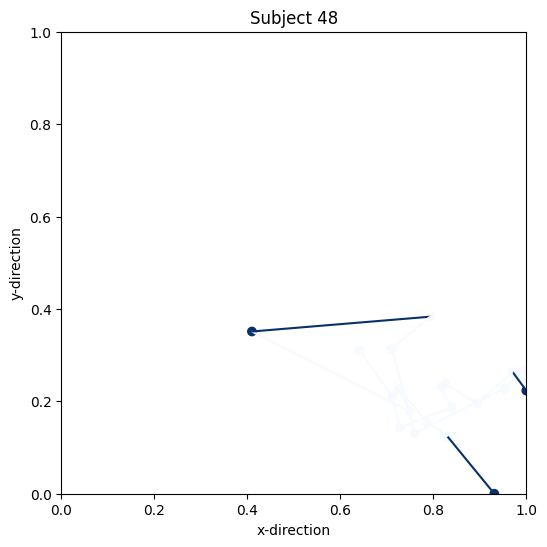

In [44]:
plt.figure(figsize=(6, 6))
ax = plt.axes()
# ax.set_facecolor('black')

for idx, pid in enumerate(all_pid_list):
    ## (-x- bad video -x-): 28, 59
    # if pid==30 or pid==42 or pid==28 or pid==59:
    # if pid==30 or pid==63 or pid==20 or pid==36:
    # if pid==39 or pid==45 or pid==48:
    if pid==90:
        label = label_dict[pid]
        colorData = colorData_dict[pid]
        data = pt_centerXY_dict[pid]['new_pt_position']
        positionX = []
        positionY = []
        for position in data:
            positionX.append(position[0])
            positionY.append(position[1])
            
        ### Normalize coordinate data --------------------------------------------------------------
        tmp_x = np.array(positionX)
        tmp_y = np.array(positionY)
        tmp_xy = np.concatenate((tmp_x.reshape(-1, 1), tmp_y.reshape(-1, 1)), axis=0)
        scaler = MinMaxScaler()
        scaler.fit(tmp_xy)
        positionX_normalized = scaler.transform(tmp_x.reshape(-1, 1)).flatten()
        positionY_normalized = scaler.transform(tmp_y.reshape(-1, 1)).flatten()

        ### Greate Line Segments ------------------------------------------------------------------
        points = np.array([positionX_normalized, positionY_normalized]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
            
        if label==0:
            norm = plt.Normalize(0, 255)
            lc = LineCollection(segments, cmap='Blues', norm=norm)
            lc.set_array(colorData)
            ax.add_collection(lc)
            plt.scatter(positionX_normalized, positionY_normalized, c=colorData, cmap='Blues')
            # plt.plot(positionX, positionY, color='lightsteelblue')
            # plt.scatter(positionX, positionY, c=colorData, cmap='Blues')

        if label==1:
            norm = plt.Normalize(0, 255)
            lc = LineCollection(segments, cmap='Reds', norm=norm)
            lc.set_array(colorData)
            ax.add_collection(lc)
            plt.scatter(positionX_normalized, positionY_normalized, c=colorData, cmap='Reds')
            # plt.plot(positionX, positionY, color='lightcoral')
            # plt.scatter(positionX, positionY, c=colorData, cmap='Reds')

plt.xlabel(f'x-direction')
plt.ylabel(f'y-direction')
plt.xlim([0, 1]) # plt.xlim([-50, 200]) # plt.xlim([-250, 350]) # plt.xlim([0, 150]) # plt.xlim([-100, 200]) 
plt.ylim([0, 1]) # plt.ylim([0, 120]) # plt.ylim([-150, 250]) # plt.ylim([0, 120]) # plt.ylim([-100, 200]) 
plt.title(f'Subject 48')
plt.show()

# Z-axis

# History

In [75]:
def FS_read_explanation_from_csv_file(target_pid, dir_path):
    heatmap_dict = {}
    for fname in list(os.listdir(dir_path)): ### ex. "37_Segment1.csv"
        pid = int(fname.split("_")[0])       ### ex. 37
        segmentName = fname.split(".")[0].split("_")[1]    ### ex. Segment1

        if pid==target_pid:
            filepath = dir_path + fname      ### ex. "Facial_Model3_0509/FS_Dynamic/GradCAM_heatmap/37_Segment1.csv"
            df = pd.read_csv(filepath, index_col=0, header=None) ### Set first column as index

            heatmap_dict[segmentName] = df
    return heatmap_dict



def FS_show_GradCAM_on_figure_tracks(pid, video_dir, coord_dir, heatmap_dict, videoType):
    ### ========================================================== Get Coordinate of Left/Right Eyes ==============================================================
    ### ex. 2_EyeTrackingAnalysis/data/01/Description1_20240314/1_raw_coordinate_data.csv
    coord_csv_file = coord_dir + str(pid) + '/Description1_20240314/1_raw_coordinate_data.csv'
    if pid>=1 and pid<=9:
        coord_csv_file = coord_dir + ("%02d" % pid) + '/Description1_20240314/1_raw_coordinate_data.csv'
    print(coord_csv_file)

    if os.path.exists(coord_csv_file)==False:
        print(f'[pid {pid}] CSV file does NOT exist.')
    else:
        coord_df = pd.read_csv(coord_csv_file, header=None)
        coord_arr = coord_df.iloc[:, :].values ### (xxx, 32) = xxx rows & 32 cols
    
    coord_arr = resize_coordinate_data(coord_arr, videoType) ### [update] 20240606
        
    pt_center = []
    pt_centerX, pt_centerY = [], []
    for i in range(n_frame):
        leftMost_x = int(coord_arr[i][26])
        rightMost_x = int(coord_arr[i][10])
        topMost_y = max(int(coord_arr[i][15]), int(coord_arr[i][31]))
        lowMost_y = min(int(coord_arr[i][7]), int(coord_arr[i][23]))
        width = abs(leftMost_x - rightMost_x)
        height = abs(topMost_y - lowMost_y)
        
        pt_center.append( [int((leftMost_x+rightMost_x)/2), int((topMost_y+lowMost_y)/2)] )
        pt_centerX.append(int((leftMost_x+rightMost_x)/2))
        pt_centerY.append(int((topMost_y+lowMost_y)/2))
    ### ===========================================================================================================================================================
    
    ### Shift to start with position [0, 0] ------------------------------
    xMin, xMax = min(pt_centerX), max(pt_centerX)
    yMin, yMax = min(pt_centerY), max(pt_centerY)
    tmp = xMin/100
    tmp = xMin-tmp
    pt_centerX = [x - tmp for x in pt_centerX]
    
    tmp = yMin/100
    tmp = yMin-tmp
    pt_centerY = [y - tmp for y in pt_centerY]
    
    
    ### Draw in "Second" dimension ------------------------------
    start = 0
    end = 30
    pt_centerX_second, pt_centerY_second = [], []
    pt_centerXY_second = []
    for i in range(0, n_frame, 30):
        start = i
        end = min(i+30, n_frame)
        pt_centerX_second.append(np.average(pt_centerX[start:end]))
        pt_centerY_second.append(np.average(pt_centerY[start:end]))
        pt_centerXY_second.append([np.average(pt_centerX[start:end]), np.average(pt_centerY[start:end])])
        
    fig_centerX = np.average(pt_centerX_second)
    fig_centerY = np.average(pt_centerY_second)
    pt_centerXY_dict[pid] = {}
    pt_centerXY_dict[pid]['fig_centerX'] = fig_centerX
    pt_centerXY_dict[pid]['fig_centerY'] = fig_centerY
    pt_centerXY_dict[pid]['pt_position'] = pt_centerXY_second

    # plt.figure(figsize=(3, 3))
    if label==0:
        # plt.scatter(x=pt_centerX_second, y=pt_centerY_second, color='blue')
        plt.plot(pt_centerX_second, pt_centerY_second, '-o', color='blue')
        
    if label==1:
        # plt.scatter(x=pt_centerX_second, y=pt_centerY_second, color='red')
        plt.plot(pt_centerX_second, pt_centerY_second, '-o', color='red')
    plt.xlabel(f'x-direction')
    plt.ylabel(f'y-direction')
    plt.title(f'[Pid {pid}]')
    # plt.show()

data/01/Description1_20240314/1_raw_coordinate_data.csv
data/02/Description1_20240314/1_raw_coordinate_data.csv
data/03/Description1_20240314/1_raw_coordinate_data.csv
data/04/Description1_20240314/1_raw_coordinate_data.csv
data/05/Description1_20240314/1_raw_coordinate_data.csv
data/06/Description1_20240314/1_raw_coordinate_data.csv
data/07/Description1_20240314/1_raw_coordinate_data.csv
data/08/Description1_20240314/1_raw_coordinate_data.csv
data/09/Description1_20240314/1_raw_coordinate_data.csv
data/10/Description1_20240314/1_raw_coordinate_data.csv
data/11/Description1_20240314/1_raw_coordinate_data.csv
data/12/Description1_20240314/1_raw_coordinate_data.csv
data/13/Description1_20240314/1_raw_coordinate_data.csv
data/14/Description1_20240314/1_raw_coordinate_data.csv
data/15/Description1_20240314/1_raw_coordinate_data.csv
data/16/Description1_20240314/1_raw_coordinate_data.csv
data/17/Description1_20240314/1_raw_coordinate_data.csv
data/18/Description1_20240314/1_raw_coordinate_d

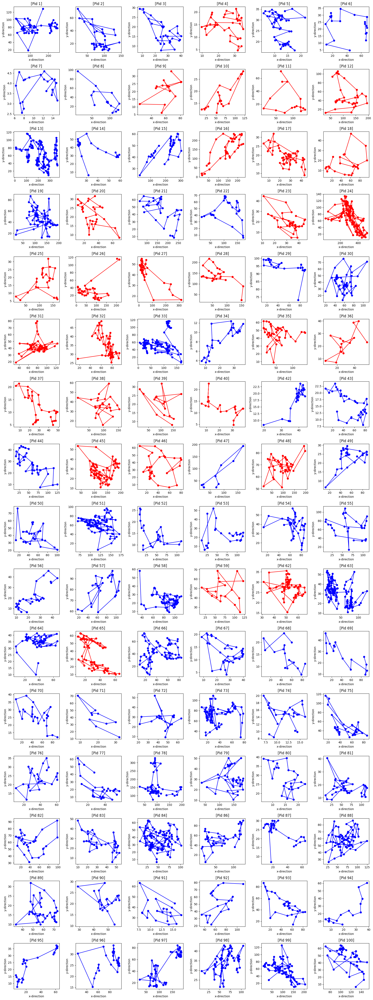

In [76]:
plt.figure(figsize=(18, 48))

pt_centerXY_dict = {}

for idx, pid in enumerate(all_pid_list):
    # bad video: 16, 59
    # if pid==30:
    # if pid==28 or pid==35 or pid==36:
    # if pid==4 or pid==18 or pid==20 or pid==37 or pid==39 or pid==48 or pid==58:
    # if pid==53:
    # if pid==1:
    # if pid!=24 and pid!=78:
    
    heatmap_dict = {}
    heatmap_dict = FS_read_explanation_from_csv_file(pid, FS_GRADCAM_PATH)

    plt.subplot(16, 6, idx+1)
    FS_show_GradCAM_on_figure_tracks(pid, VIDEO_PATH, COORDINATE_PATH, heatmap_dict, videoType_dict[pid])        
        
plt.tight_layout()
plt.show()

In [84]:
def get_center_position_of_figure_visualization(pt_dict):
    pt_x, pt_y = [], []
    for pid in pt_dict:
        pt_x.append(pt_dict[pid]['fig_centerX'])
        pt_y.append(pt_dict[pid]['fig_centerY'])
    all_pid_fig_centerX = np.average(pt_x)
    all_pid_fig_centerY = np.average(pt_y)
    print(f'all_pid_fig_centerX: {all_pid_fig_centerX}')
    print(f'all_pid_fig_centerY: {all_pid_fig_centerY}')
    
    for pid in pt_dict:
        original_centerX = pt_dict[pid]['fig_centerX']
        original_centerY = pt_dict[pid]['fig_centerY']

        shiftX = all_pid_fig_centerX - original_centerX
        shiftY = all_pid_fig_centerY - original_centerY

        data = pt_dict[pid]['pt_position']
        new_data = []
        for position in data:
            x = position[0]
            y = position[1]

            new_x = x + shiftX
            new_y = y + shiftY
            new_data.append([new_x, new_y])
        pt_centerXY_dict[pid]['new_pt_position'] = new_data
    
    
get_center_position_of_figure_visualization(pt_centerXY_dict)

all_pid_fig_centerX: 66.95169314484649
all_pid_fig_centerY: 38.696277474579254


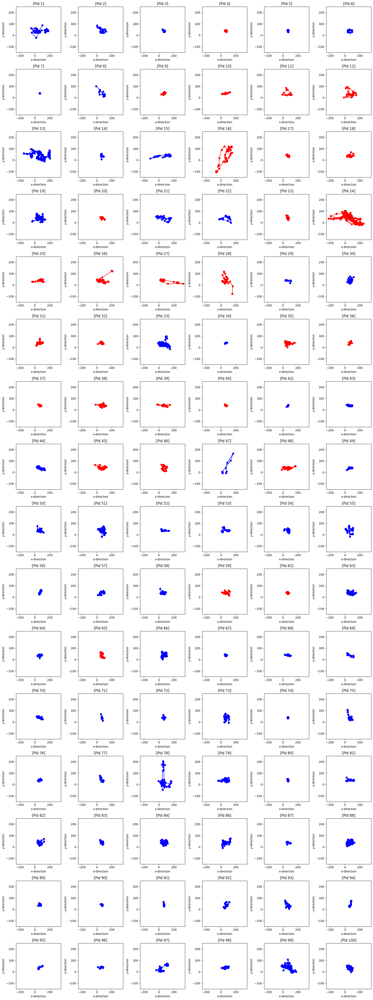

In [96]:
plt.figure(figsize=(18, 48))
for idx, pid in enumerate(all_pid_list):
    plt.subplot(16, 6, idx+1)
    
    label = label_dict[pid]
    
    data = pt_centerXY_dict[pid]['new_pt_position']
    positionX = []
    positionY = []
    for position in data:
        positionX.append(position[0])
        positionY.append(position[1])
    
    if label==0:
        plt.plot(positionX, positionY, '-o', color='blue')
    if label==1:
        plt.plot(positionX, positionY, '-o', color='red')
    plt.xlabel(f'x-direction')
    plt.ylabel(f'y-direction')
    plt.xlim([-250, 350])
    plt.ylim([-150, 250])
    plt.title(f'[Pid {pid}]')

plt.tight_layout()
plt.show()

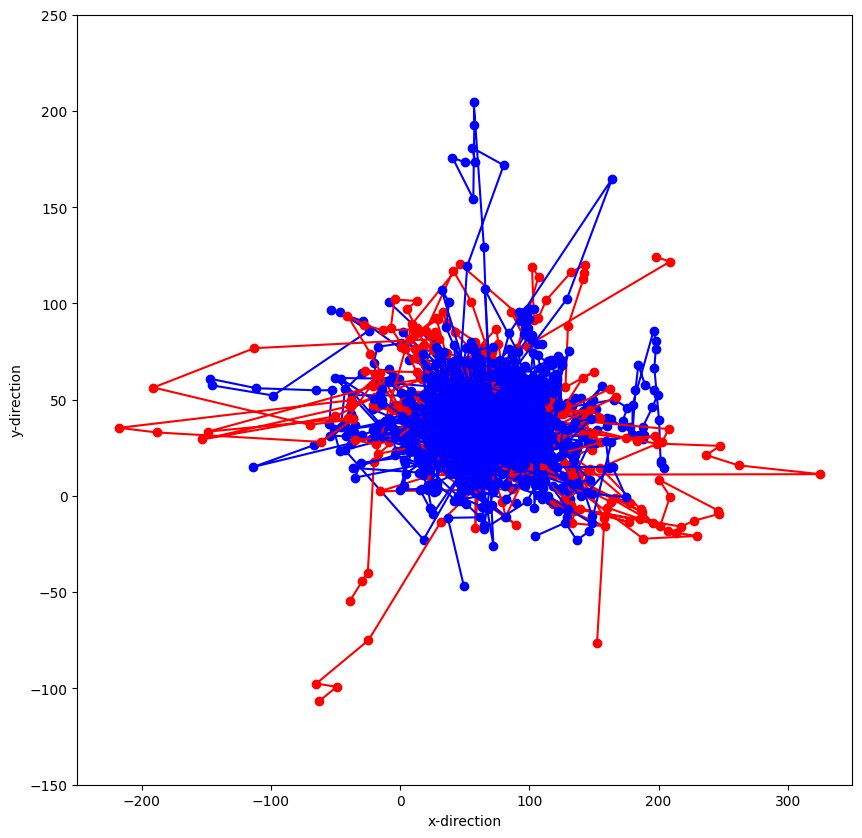

In [95]:
plt.figure(figsize=(10, 10))
for idx, pid in enumerate(all_pid_list):
    label = label_dict[pid]
    data = pt_centerXY_dict[pid]['new_pt_position']
    positionX = []
    positionY = []
    for position in data:
        positionX.append(position[0])
        positionY.append(position[1])
    if label==0:
        plt.plot(positionX, positionY, '-o', color='blue')
    if label==1:
        plt.plot(positionX, positionY, '-o', color='red')
    plt.xlabel(f'x-direction')
    plt.ylabel(f'y-direction')
    plt.xlim([-250, 350])
    plt.ylim([-150, 250])
plt.show()

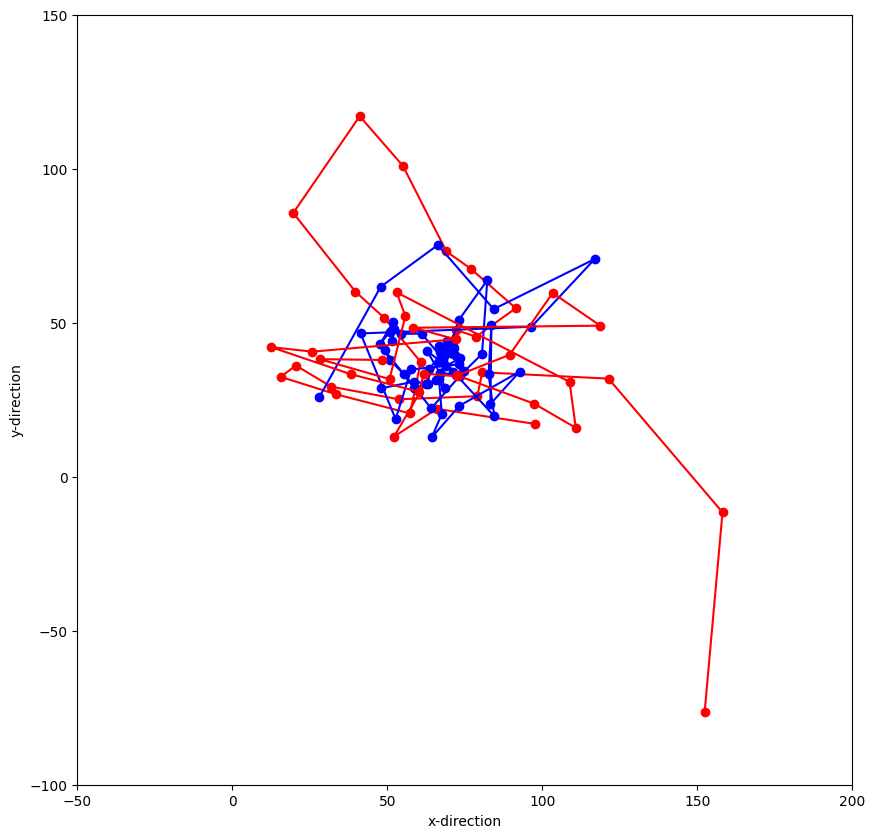

In [100]:
plt.figure(figsize=(10, 10))
for idx, pid in enumerate(all_pid_list):
    if pid==30 or pid==42 or pid==28 or pid==59:
        label = label_dict[pid]
        data = pt_centerXY_dict[pid]['new_pt_position']
        positionX = []
        positionY = []
        for position in data:
            positionX.append(position[0])
            positionY.append(position[1])
        if label==0:
            plt.plot(positionX, positionY, '-o', color='blue')
        if label==1:
            plt.plot(positionX, positionY, '-o', color='red')
plt.xlabel(f'x-direction')
plt.ylabel(f'y-direction')
plt.xlim([-50, 200]) # plt.xlim([-250, 350])
plt.ylim([-100, 150]) # plt.ylim([-150, 250])
plt.show()

In [80]:
pt_centerXY_dict[1]['fig_centerX']
pt_centerXY_dict[1]['fig_centerY']
pt_centerXY_dict[1]['pt_position']
pt_centerXY_dict[1]['new_pt_position']

[[137.1870264781798, 23.30627747457924],
 [145.72035981151316, 27.57294414124592],
 [143.78702647817983, 31.139610807912582],
 [141.72035981151316, 44.27294414124591],
 [139.4536931448465, 41.672944141245914],
 [145.08702647817984, 43.47294414124591],
 [140.25369314484647, 36.30627747457924],
 [149.25369314484647, 49.63961080791258],
 [156.38702647817985, 57.27294414124591],
 [136.4870264781798, 41.80627747457924],
 [132.6536931448465, 46.539610807912574],
 [146.6536931448465, 47.73961080791258],
 [165.62035981151314, 50.10627747457925],
 [175.9536931448465, 45.80627747457924],
 [172.12035981151314, 38.87294414124592],
 [177.9870264781798, 35.839610807912585],
 [171.4536931448465, 36.00627747457924],
 [163.08702647817984, 40.10627747457925],
 [88.85369314484647, 42.93961080791258],
 [-5.546306855153517, 35.37294414124592],
 [-18.379640188486846, 33.706277474579245],
 [-5.946306855153509, 32.039610807912574],
 [-1.2129735218201745, 33.27294414124591],
 [21.820359811513157, 22.4396108079

In [51]:
maxDist = 0
maxDist_list = []
skipPid = []
skipPid = [1, 12, 13, 15, 16, 19, 21, 22, 24, 25, 26, 27, 28, 33, 38, 39, 45, 47, 48, 51, 53, 54, 55, 57, 58, 59, 63, 66, 68, 69, 70, 73, 75, 78, 79, 81, 82, 84, 86, 88, 92, 93, 96, 97, 98, 99, 100]

def FS_read_explanation_from_csv_file(target_pid, dir_path):
    heatmap_dict = {}
    for fname in list(os.listdir(dir_path)): ### ex. "37_Segment1.csv"
        pid = int(fname.split("_")[0])       ### ex. 37
        segmentName = fname.split(".")[0].split("_")[1]    ### ex. Segment1

        if pid==target_pid:
            filepath = dir_path + fname      ### ex. "Facial_Model3_0509/FS_Dynamic/GradCAM_heatmap/37_Segment1.csv"
            df = pd.read_csv(filepath, index_col=0, header=None) ### Set first column as index

            heatmap_dict[segmentName] = df
    return heatmap_dict



def FS_show_GradCAM_on_figure_tracks(pid, video_dir, coord_dir, heatmap_dict, videoType):
    ### ================================================================ Get heatmap value of Eyes ================================================================
    segmentNames = list(heatmap_dict.keys())
    segmentNames.sort()
    sorted_dict = {segName: heatmap_dict[segName] for segName in segmentNames}
    heatmap_dict = sorted_dict
    ### ---------------------- Get some info [start] --------------------
    label = label_dict[pid]
    foldIdx = foldIdx_dict[pid]
    threshold = FS_threshold_facial_5f[foldIdx]
    prob_dict = FS_segProb_dict[pid]   ### ex. prob_dict = {'segment_0': 0.876, 'segment_1': 0.9994}
    prob_dict_rename = {}              ### ex. prob_dict_rename = {'Segment0': 0.876, 'Segment1': 0.9994}
    for key in prob_dict:
        prob = prob_dict[key]
        segName = 'Segment' + str(key.split('_')[1])
        prob_dict_rename[segName] = prob
    ### ---------------------- Get some info [end] -----------------------


    # ## --------------------------- draw every segment directly ---------------------------
    n_segment = len(heatmap_dict)
    n_frame = (n_segment-1)*n_GAP + n_PERIOD
    Avg = [0] * n_frame
    Times = [0] * n_frame

    start = 0
    end = n_PERIOD
    for key in heatmap_dict:
        prob = prob_dict_rename[key]
        heatmap = heatmap_dict[key] ### heatmap for one segment

        n_feature, n_timestamp = heatmap.shape[0], heatmap.shape[1] ### 10 features with 300 timestamp
        heatmap = heatmap.iloc[:, :].values

        for i in range(n_timestamp):
            cur_frame = start + i

            left2x, left2y, left3x, left3y = heatmap[0][i], heatmap[1][i], heatmap[2][i], heatmap[3][i]
            right1x, right1y, right2x, right2y, right3x, right3y = heatmap[4][i], heatmap[5][i], heatmap[6][i], heatmap[7][i], heatmap[8][i], heatmap[9][i]

            avg = (left2x + left2y + left3x + left3y + right1x + right1y + right2x + right2y + right3x + right3y)/10

            Avg[cur_frame] += avg
            Times[cur_frame] += 1
                
        start += n_GAP
        end = start + n_PERIOD
        
    for i in range(n_frame):
        if Times[i]!=0:
            Avg[i] = int(Avg[i]/Times[i])
    

    for i in range(0, n_frame, 30):
        start = i
        end = min(i+30, n_frame)
        # avg_30 = np.average(Avg[start:end])
        avg_30 = max(Avg[start:end])
        for j in range(start, end):
            Avg[j] = avg_30
        
            
    # ## ---------------- Get Color Mapping [start] ----------------
    max_Avg = max(Avg)
    color_map = mpl.colormaps.get_cmap('jet') # 'cool', viridis'
    
    heatmap_min_max = np.array([0, 255])
    norm_Avg = mpl.colors.Normalize(vmin=min(heatmap_min_max), vmax=max(heatmap_min_max))
    # norm_Avg = mpl.colors.Normalize(vmin=min(Avg), vmax=max(Avg))
    
    color_mapper_Avg = mpl.cm.ScalarMappable(norm=norm_Avg, cmap=color_map)
    # color_mapper_Avg = mpl.cm.ScalarMappable(norm=None, cmap=color_map)
    # ## ---------------- Get Color Mapping [end] ------------------
    ### ===========================================================================================================================================================
        
        
    ### ========================================================== Get Coordinate of Left/Right Eyes ==============================================================
    ### ex. 2_EyeTrackingAnalysis/data/01/Description1_20240314/1_raw_coordinate_data.csv
    coord_csv_file = coord_dir + str(pid) + '/Description1_20240314/1_raw_coordinate_data.csv'
    if pid>=1 and pid<=9:
        coord_csv_file = coord_dir + ("%02d" % pid) + '/Description1_20240314/1_raw_coordinate_data.csv'
    print(coord_csv_file)

    if os.path.exists(coord_csv_file)==False:
        print(f'[pid {pid}] CSV file does NOT exist.')
    else:
        coord_df = pd.read_csv(coord_csv_file, header=None)
        coord_arr = coord_df.iloc[:, :].values ### (xxx, 32) = xxx rows & 32 cols
        
    coord_arr = resize_coordinate_data(coord_arr, videoType) ### [update] 20240606
        
    pt_center = []
    pt_centerX, pt_centerY = [], []
    for i in range(n_frame):
        leftMost_x = int(coord_arr[i][26])
        rightMost_x = int(coord_arr[i][10])
        topMost_y = max(int(coord_arr[i][15]), int(coord_arr[i][31]))
        lowMost_y = min(int(coord_arr[i][7]), int(coord_arr[i][23]))
        width = abs(leftMost_x - rightMost_x)
        height = abs(topMost_y - lowMost_y)
        
        pt_center.append( [int((leftMost_x+rightMost_x)/2), int((topMost_y+lowMost_y)/2)] )
        pt_centerX.append(int((leftMost_x+rightMost_x)/2))
        pt_centerY.append(int((topMost_y+lowMost_y)/2))
    ### ===========================================================================================================================================================
    
    xMin, xMax = min(pt_centerX), max(pt_centerX)
    yMin, yMax = min(pt_centerY), max(pt_centerY)
    tmp = xMin/100
    tmp = xMin-tmp
    pt_centerX = [x - tmp for x in pt_centerX]
    
    tmp = yMin/100
    tmp = yMin-tmp
    pt_centerY = [y - tmp for y in pt_centerY]
    
    
    start = 0
    end = 30
    pt_centerX_second, pt_centerY_second = [], []
    for i in range(0, n_frame, 30):
        start = i
        end = min(i+30, n_frame)
        pt_centerX_second.append(np.average(pt_centerX[start:end]))
        pt_centerY_second.append(np.average(pt_centerY[start:end]))
    
    maxDist = max(max(pt_centerX_second), max(pt_centerY_second))
    if maxDist>100:
        skipPid.append(pid)
    else:
        maxDist_list.append(maxDist)
    
    # plt.figure(figsize=(3, 3))
    if label==0:
        # plt.scatter(x=pt_centerX_second, y=pt_centerY_second, color='blue')
        plt.plot(pt_centerX_second, pt_centerY_second, '-o', color='blue')
    if label==1:
        # plt.scatter(x=pt_centerX_second, y=pt_centerY_second, color='red')
        plt.plot(pt_centerX_second, pt_centerY_second, '-o', color='red')
    plt.xlim([0, 100])
    plt.ylim([0, 100])
    plt.xlabel(f'x-direction')
    plt.ylabel(f'y-direction')
    plt.title(f'[Pid {pid}]')
    # plt.show()

data/02/Description1_20240314/1_raw_coordinate_data.csv
data/03/Description1_20240314/1_raw_coordinate_data.csv
data/04/Description1_20240314/1_raw_coordinate_data.csv
data/05/Description1_20240314/1_raw_coordinate_data.csv
data/06/Description1_20240314/1_raw_coordinate_data.csv
data/07/Description1_20240314/1_raw_coordinate_data.csv
data/08/Description1_20240314/1_raw_coordinate_data.csv
data/09/Description1_20240314/1_raw_coordinate_data.csv
data/10/Description1_20240314/1_raw_coordinate_data.csv
data/11/Description1_20240314/1_raw_coordinate_data.csv
data/14/Description1_20240314/1_raw_coordinate_data.csv
data/17/Description1_20240314/1_raw_coordinate_data.csv
data/18/Description1_20240314/1_raw_coordinate_data.csv
data/20/Description1_20240314/1_raw_coordinate_data.csv
data/23/Description1_20240314/1_raw_coordinate_data.csv
data/29/Description1_20240314/1_raw_coordinate_data.csv
data/30/Description1_20240314/1_raw_coordinate_data.csv
data/31/Description1_20240314/1_raw_coordinate_d

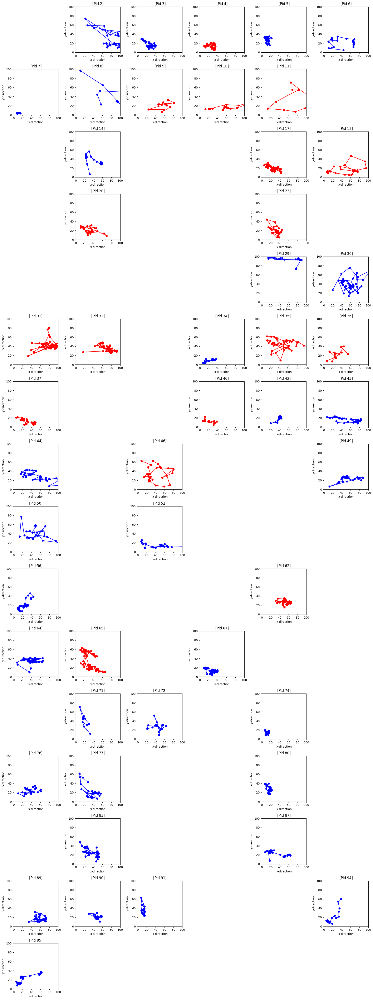

In [52]:
plt.figure(figsize=(18, 48))

for idx, pid in enumerate(all_pid_list):
    # bad video: 16, 59
    # if pid==30:
    # if pid==28 or pid==35 or pid==36:
    # if pid==4 or pid==18 or pid==20 or pid==37 or pid==39 or pid==48 or pid==58:
    # if pid==53:
    # if pid==1:
    # if pid!=24 and pid!=78:
    if pid not in skipPid:
        heatmap_dict = {}
        heatmap_dict = FS_read_explanation_from_csv_file(pid, FS_GRADCAM_PATH)

        plt.subplot(16, 6, idx+1)
        FS_show_GradCAM_on_figure_tracks(pid, VIDEO_PATH, COORDINATE_PATH, heatmap_dict, videoType_dict[pid])        
        
plt.tight_layout()
plt.show()

In [17]:
print(max(maxDist_list))
print(skipPid)
print(len(skipPid))

98.2466666666666
[1, 12, 13, 15, 16, 19, 21, 22, 24, 25, 26, 27, 28, 33, 38, 39, 45, 47, 48, 51, 53, 54, 55, 57, 58, 59, 63, 66, 68, 69, 70, 73, 75, 78, 79, 81, 82, 84, 86, 88, 92, 93, 96, 97, 98, 99, 100]
47


In [18]:
maxDist = 0
maxDist_list = []
skipPid = []
skipPid = [1, 12, 13, 15, 16, 19, 21, 22, 24, 25, 26, 27, 28, 33, 38, 39, 45, 47, 48, 51, 53, 54, 55, 57, 58, 59, 63, 66, 68, 69, 70, 73, 75, 78, 79, 81, 82, 84, 86, 88, 92, 93, 96, 97, 98, 99, 100]

def FS_read_explanation_from_csv_file(target_pid, dir_path):
    heatmap_dict = {}
    for fname in list(os.listdir(dir_path)): ### ex. "37_Segment1.csv"
        pid = int(fname.split("_")[0])       ### ex. 37
        segmentName = fname.split(".")[0].split("_")[1]    ### ex. Segment1

        if pid==target_pid:
            filepath = dir_path + fname      ### ex. "Facial_Model3_0509/FS_Dynamic/GradCAM_heatmap/37_Segment1.csv"
            df = pd.read_csv(filepath, index_col=0, header=None) ### Set first column as index

            heatmap_dict[segmentName] = df
    return heatmap_dict



def FS_show_GradCAM_on_figure_tracks(pid, video_dir, coord_dir, heatmap_dict, videoType):
    ### ================================================================ Get heatmap value of Eyes ================================================================
    segmentNames = list(heatmap_dict.keys())
    segmentNames.sort()
    sorted_dict = {segName: heatmap_dict[segName] for segName in segmentNames}
    heatmap_dict = sorted_dict
    ### ---------------------- Get some info [start] --------------------
    label = label_dict[pid]
    foldIdx = foldIdx_dict[pid]
    threshold = FS_threshold_facial_5f[foldIdx]
    prob_dict = FS_segProb_dict[pid]   ### ex. prob_dict = {'segment_0': 0.876, 'segment_1': 0.9994}
    prob_dict_rename = {}              ### ex. prob_dict_rename = {'Segment0': 0.876, 'Segment1': 0.9994}
    for key in prob_dict:
        prob = prob_dict[key]
        segName = 'Segment' + str(key.split('_')[1])
        prob_dict_rename[segName] = prob
    ### ---------------------- Get some info [end] -----------------------


    # ## --------------------------- draw every segment directly ---------------------------
    n_segment = len(heatmap_dict)
    n_frame = (n_segment-1)*n_GAP + n_PERIOD
    Avg = [0] * n_frame
    Times = [0] * n_frame

    start = 0
    end = n_PERIOD
    for key in heatmap_dict:
        prob = prob_dict_rename[key]
        heatmap = heatmap_dict[key] ### heatmap for one segment

        n_feature, n_timestamp = heatmap.shape[0], heatmap.shape[1] ### 10 features with 300 timestamp
        heatmap = heatmap.iloc[:, :].values

        for i in range(n_timestamp):
            cur_frame = start + i

            left2x, left2y, left3x, left3y = heatmap[0][i], heatmap[1][i], heatmap[2][i], heatmap[3][i]
            right1x, right1y, right2x, right2y, right3x, right3y = heatmap[4][i], heatmap[5][i], heatmap[6][i], heatmap[7][i], heatmap[8][i], heatmap[9][i]

            avg = (left2x + left2y + left3x + left3y + right1x + right1y + right2x + right2y + right3x + right3y)/10

            Avg[cur_frame] += avg
            Times[cur_frame] += 1
                
        start += n_GAP
        end = start + n_PERIOD
        
    for i in range(n_frame):
        if Times[i]!=0:
            Avg[i] = int(Avg[i]/Times[i])
    

    for i in range(0, n_frame, 30):
        start = i
        end = min(i+30, n_frame)
        # avg_30 = np.average(Avg[start:end])
        avg_30 = max(Avg[start:end])
        for j in range(start, end):
            Avg[j] = avg_30
        
            
    # ## ---------------- Get Color Mapping [start] ----------------
    max_Avg = max(Avg)
    color_map = mpl.colormaps.get_cmap('jet') # 'cool', viridis'
    
    heatmap_min_max = np.array([0, 255])
    norm_Avg = mpl.colors.Normalize(vmin=min(heatmap_min_max), vmax=max(heatmap_min_max))
    # norm_Avg = mpl.colors.Normalize(vmin=min(Avg), vmax=max(Avg))
    
    color_mapper_Avg = mpl.cm.ScalarMappable(norm=norm_Avg, cmap=color_map)
    # color_mapper_Avg = mpl.cm.ScalarMappable(norm=None, cmap=color_map)
    # ## ---------------- Get Color Mapping [end] ------------------
    ### ===========================================================================================================================================================
        
        
    ### ========================================================== Get Coordinate of Left/Right Eyes ==============================================================
    ### ex. 2_EyeTrackingAnalysis/data/01/Description1_20240314/1_raw_coordinate_data.csv
    coord_csv_file = coord_dir + str(pid) + '/Description1_20240314/1_raw_coordinate_data.csv'
    if pid>=1 and pid<=9:
        coord_csv_file = coord_dir + ("%02d" % pid) + '/Description1_20240314/1_raw_coordinate_data.csv'
    print(coord_csv_file)

    if os.path.exists(coord_csv_file)==False:
        print(f'[pid {pid}] CSV file does NOT exist.')
    else:
        coord_df = pd.read_csv(coord_csv_file, header=None)
        coord_arr = coord_df.iloc[:, :].values ### (xxx, 32) = xxx rows & 32 cols
        
    pt_center = []
    pt_centerX, pt_centerY = [], []
    for i in range(n_frame):
        leftMost_x = int(coord_arr[i][26])
        rightMost_x = int(coord_arr[i][10])
        topMost_y = max(int(coord_arr[i][15]), int(coord_arr[i][31]))
        lowMost_y = min(int(coord_arr[i][7]), int(coord_arr[i][23]))
        width = abs(leftMost_x - rightMost_x)
        height = abs(topMost_y - lowMost_y)
        
        pt_center.append( [int((leftMost_x+rightMost_x)/2), int((topMost_y+lowMost_y)/2)] )
        pt_centerX.append(int((leftMost_x+rightMost_x)/2))
        pt_centerY.append(int((topMost_y+lowMost_y)/2))
    ### ===========================================================================================================================================================
    
    xMin, xMax = min(pt_centerX), max(pt_centerX)
    yMin, yMax = min(pt_centerY), max(pt_centerY)
    tmp = xMin/100
    tmp = xMin-tmp
    pt_centerX = [x - tmp for x in pt_centerX]
    
    tmp = yMin/100
    tmp = yMin-tmp
    pt_centerY = [y - tmp for y in pt_centerY]
    
    
    start = 0
    end = 30
    pt_centerX_second, pt_centerY_second = [], []
    for i in range(0, n_frame, 30):
        start = i
        end = min(i+30, n_frame)
        pt_centerX_second.append(np.average(pt_centerX[start:end]))
        pt_centerY_second.append(np.average(pt_centerY[start:end]))
    
    maxDist = max(max(pt_centerX_second), max(pt_centerY_second))
    if maxDist>100:
        skipPid.append(pid)
    else:
        maxDist_list.append(maxDist)
    
    # plt.figure(figsize=(3, 3))
    if label==0:
        # plt.scatter(x=pt_centerX_second, y=pt_centerY_second, color='blue')
        plt.plot(pt_centerX_second, pt_centerY_second, '-o', color='blue')
    if label==1:
        # plt.scatter(x=pt_centerX_second, y=pt_centerY_second, color='red')
        plt.plot(pt_centerX_second, pt_centerY_second, '-o', color='red')
    plt.xlim([0, 100])
    plt.ylim([0, 100])
    plt.xlabel(f'x-direction')
    plt.ylabel(f'y-direction')
    plt.title(f'[Pid {pid}]')
    # plt.show()

data/02/Description1_20240314/1_raw_coordinate_data.csv
data/03/Description1_20240314/1_raw_coordinate_data.csv
data/04/Description1_20240314/1_raw_coordinate_data.csv
data/05/Description1_20240314/1_raw_coordinate_data.csv
data/06/Description1_20240314/1_raw_coordinate_data.csv
data/07/Description1_20240314/1_raw_coordinate_data.csv
data/08/Description1_20240314/1_raw_coordinate_data.csv
data/09/Description1_20240314/1_raw_coordinate_data.csv
data/10/Description1_20240314/1_raw_coordinate_data.csv
data/11/Description1_20240314/1_raw_coordinate_data.csv
data/14/Description1_20240314/1_raw_coordinate_data.csv
data/17/Description1_20240314/1_raw_coordinate_data.csv
data/18/Description1_20240314/1_raw_coordinate_data.csv
data/20/Description1_20240314/1_raw_coordinate_data.csv
data/23/Description1_20240314/1_raw_coordinate_data.csv
data/29/Description1_20240314/1_raw_coordinate_data.csv
data/30/Description1_20240314/1_raw_coordinate_data.csv
data/31/Description1_20240314/1_raw_coordinate_d

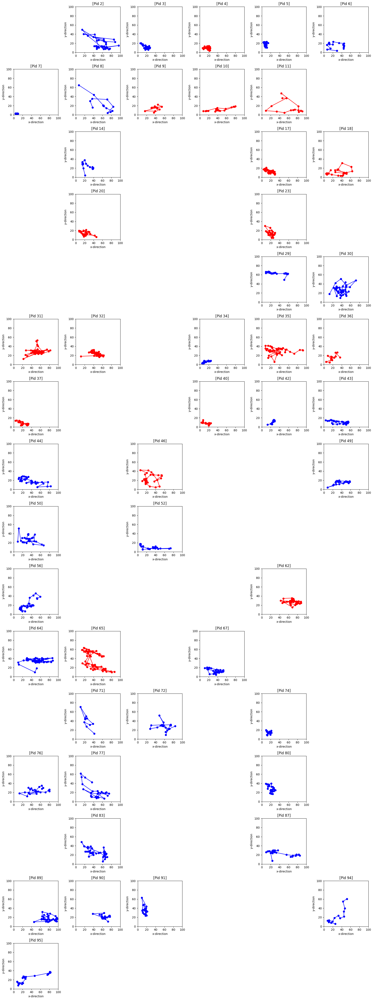

In [19]:
plt.figure(figsize=(18, 48))

for idx, pid in enumerate(all_pid_list):
    # bad video: 16, 59
    # if pid==30:
    # if pid==28 or pid==35 or pid==36:
    # if pid==4 or pid==18 or pid==20 or pid==37 or pid==39 or pid==48 or pid==58:
    # if pid==53:
    # if pid==1:
    # if pid!=24 and pid!=78:
    if pid not in skipPid:
        heatmap_dict = {}
        heatmap_dict = FS_read_explanation_from_csv_file(pid, FS_GRADCAM_PATH)

        plt.subplot(16, 6, idx+1)
        FS_show_GradCAM_on_figure_tracks(pid, VIDEO_PATH, COORDINATE_PATH, heatmap_dict, videoType_dict[pid])        
        
plt.tight_layout()
plt.show()